# DATA

## What is this notebook about

This notebook builds upon the notebook ``` spacenet6_masking.ipynb ```

``` spacenet6_masking.ipynb ``` is used to generate all the masks for all 3401 training images, using only the PAN images and geojson_buildings files. These masks will be the same regardless of the original data format, hence it is a run-once-and-forget. 



This notebook shall be used for resizing all image input format. The available input formats will be
* PAN
* PS-RGB
* PS-RGBNIR
* RGBNIR
* SAR-Intensity

After resizing, these images will be saved to reduce the need for further processing. They will be saved in their original channel format, as a .tif file. The resized images will be read in and fed to a unet model to identify buildings. 

Functions to support data generation from all five image modes will be made available to easily generate the needed data

**Explore SAR data**

This notebook shall try and explore how to effectively use SAR data, and what to do to make a unet learn well from it

segmentation-models has the following backbones available:
``` ['resnet18', 'resnet34', 'resnet50', 'resnet101', 'resnet152', 'seresnet18', 'seresnet34', 'seresnet50', 'seresnet101', 'seresnet152', 'seresnext50', 'seresnext101', 'senet154', 'resnext50', 'resnext101', 'vgg16', 'vgg19', 'densenet121', 'densenet169', 'densenet201', 'inceptionresnetv2', 'inceptionv3', 'mobilenet', 'mobilenetv2', 'efficientnetb0', 'efficientnetb1', 'efficientnetb2', 'efficientnetb3', 'efficientnetb4', 'efficientnetb5', 'efficientnetb6', 'efficientnetb7'] ```

## Setup COLAB and imports

Mount drive to gain access to files

In [ ]:
''' Used to reference the root directory, for directory traversal ''' 
from google.colab import drive
drive.mount('/content/gdrive', force_remount=True)
mount_dir = '/content/gdrive'
root_dir = '/content/gdrive/My Drive/Colab Notebooks'

Mounted at /content/gdrive


Installations required

In [ ]:
! pip install rasterio
! pip install keras_unet
! pip install focal-loss
! pip install segmentation-models

Imports required

In [ ]:
''' dealing with .tif files '''
import rasterio
from rasterio.plot import show, reshape_as_raster, reshape_as_image

''' plotting images '''
from matplotlib import pyplot as plt
%matplotlib inline

''' traversing directories '''
import os
from pathlib import Path

''' core '''
import numpy as np
import pandas as pd

''' utilities '''
from tqdm import tqdm
import copy
import datetime

''' image processing '''
import tensorflow as tf
from tensorflow.keras.preprocessing import image

''' unet model '''
from keras import backend as K
from focal_loss import BinaryFocalLoss
from keras_unet.models import satellite_unet

import segmentation_models_dev as sm
from segmentation_models import Unet
from segmentation_models.losses import JaccardLoss, BinaryFocalLoss
from segmentation_models.metrics import IOUScore, FScore

Using TensorFlow backend.


-----------------------------------------
keras-unet init: TF version is >= 2.0.0 - using `tf.keras` instead of `Keras`
-----------------------------------------
Segmentation Models: using `keras` framework.


## Global

Constants and lookups - For reference the various image types are as such (amax is a rough gauge):

```
type             shape                dtype       gauge of max value    gauge of min value
PAN              (1, 900, 900)        uint16      1844                  0
PS-RGB           (3, 900, 900)        uint8       255                   0
PS-RGBNIR        (4, 900, 900)        uint16      2047                  0
RGBNIR           (4, 450, 450)        uint16      2047                  0
SAR-Intensity    (4, 900, 900)        float32     82.70110321044922     0.0
```



In [ ]:
''' get the same sequence for random set every time '''
seed = 42
np.random.seed = seed
tf.seed = seed       

''' lookup - define image channels for each image type '''
IMG_TYPE_LOOKUP = {
    'PAN': {'channels': 1, 'dtype': np.uint16}, 
    'PS-RGB': {'channels': 3, 'dtype': np.uint8}, 
    'PS-RGBNIR': {'channels': 4, 'dtype': np.uint16}, 
    'RGBNIR': {'channels': 4, 'dtype': np.uint16}, 
    'SAR-Intensity': {'channels': 4, 'dtype': np.float32}, 
}

We will be setting the amount of data that we want to use for train/test
* There are 3401 images for each image type
* The actual spacenet6 "test folder" has only uneseen SAR-Intensity data

Therefore for training purposes, we will pull out our own "test data" from the training set for ease of verifying output 

Random indexes will be used for training and test

In [ ]:
''' set the various sizes we want to use '''
SIZE_ALL = 3401 
SIZE_TRAIN = 800           # CHANGE HERE
SIZE_TEST = 80            # CHANGE HERE


''' Generate the indexes that we will be using for train and test '''
ALL_IDX = np.arange(SIZE_ALL)

TRAIN_IDX = np.random.choice(ALL_IDX, SIZE_TRAIN, replace=False)
TRAIN_IDX.sort()

ALL_IDX_2 = np.setdiff1d(ALL_IDX, TRAIN_IDX)

TEST_IDX = np.random.choice(ALL_IDX_2, SIZE_TEST, replace=False)
TEST_IDX.sort()

## Helper functions

Available functions:
* ``` plot_XY(plotname: str, X: np.dtype[SIZE], Y: np.bool[SIZE], X_name: str, Y_name: str) : None ```
* ``` plot_XY_preds(plotname: str, X: np.dtype[SIZE], Y: np.bool[SIZE], P: np.bool[SIZE], X_name: str, Y_name: str, P_name: str) : None ```
* ``` recall_m(y_true, y_pred) : None ```
* ``` precision_m(y_true, y_pred) : None ```
* ``` f1_m(y_true, y_pred) : None ```

Various plotting functions

In [ ]:
def plot_XY(plotname, X, Y, X_name, Y_name):
  ix = np.random.randint(0, len(X))
  print("index: {}".format(ix))
  print(plotname, " set")

  fig, (ax1, ax2) = plt.subplots(1,2, figsize=(16,5))
  show(reshape_as_raster(X[ix]), ax=ax1, title=X_name)
  show(reshape_as_raster(Y[ix]), ax=ax2, title=Y_name)
  plt.show()

In [ ]:
def plot_XY_preds(plotname, X, Y, P, X_name, Y_name, P_name):
  ix = np.random.randint(0, len(X))
  print("index: {}".format(ix))
  print(plotname, " set")

  fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16,5))
  show(reshape_as_raster(X[ix]), ax=ax1, title=X_name)
  show(reshape_as_raster(Y[ix]), ax=ax2, title=Y_name)
  show(reshape_as_raster(P[ix]), ax=ax3, title=P_name)
  plt.show()

In [ ]:
def plot_history(history):
  fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(16,5))

  ax1.plot(history['loss'], label='train')
  ax1.plot(history['val_loss'], label='val')
  ax1.title.set_text('loss')
  ax1.legend()

  ax2.plot(history['iou_score'], label='train')
  ax2.plot(history['val_iou_score'], label='val')
  ax2.title.set_text('iou_score')
  ax2.legend()

  ax3.plot(history['f1-score'], label='train')
  ax3.plot(history['val_f1-score'], label='val')
  ax3.title.set_text('f1-score')
  ax3.legend()

Define metrics for the unet models

In [ ]:
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

Create a csv file to store metrics history

In [ ]:
PATH_METRICS = '/content/gdrive/My Drive/Colab Notebooks/spacenet6/metrics_keras_8_9_10.csv'

# TIMESTAMP = datetime.datetime.now().strftime("%d/%m/%Y %H:%M:%S")
# IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION = 'trial', 'trial', 'trial', 'trial'
# SIZE_TRAIN, SIZE_TEST, train_loss, train_iou_score, train_f1_score, val_loss, val_iou_score, val_f1_score, test_loss, test_iou_score, test_f1_score = 0,0,0,0,0,0,0,0,0,0,0

# METRICS_HISTORY = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, 
#                              train_loss, train_iou_score, train_f1_score, 
#                              val_loss, val_iou_score, val_f1_score, 
#                              test_loss, test_iou_score, test_f1_score
#                              ]]),
#                    columns=['timestamp', 'img_type', 'model_type', 'pretrain', 'loss_function', 'size_train', 'size_test', 
#                             'train_loss', 'train_iou_score', 'train_f1-score', 
#                             'val_loss', 'val_iou_score', 'val_f1-score', 
#                             'test_loss', 'test_iou_score', 'test_f1-score'
#                             ],
#                   )
# METRICS_HISTORY.to_csv(PATH_METRICS, index=False)



In [ ]:
def store_metrics(train_loss, train_iou_score, train_f1_score, val_loss, val_iou_score, val_f1_score, test_loss, test_iou_score, test_f1_score, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS):
  TIMESTAMP = datetime.datetime.now().strftime("%m/%d/%Y %H:%M:%S")

  ''' create another df that looks just like that and concat with ''' 
  new_metrics = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, 
                             train_loss, train_iou_score, train_f1_score, 
                             val_loss, val_iou_score, val_f1_score, 
                             test_loss, test_iou_score, test_f1_score
                             ]]),
                   columns=['timestamp', 'img_type', 'model_type', 'pretrain', 'loss_function', 'size_train', 'size_test', 
                            'train_loss', 'train_iou_score', 'train_f1-score', 
                            'val_loss', 'val_iou_score', 'val_f1-score', 
                            'test_loss', 'test_iou_score', 'test_f1-score'
                            ],
                  )
  
  METRICS_HISTORY = pd.read_csv(PATH_METRICS)
  METRICS_HISTORY = pd.concat([new_metrics, METRICS_HISTORY])
  METRICS_HISTORY.to_csv(PATH_METRICS, index=False)
  print("saved model metrics")


## Generator

Available generators: 

* ``` gen_input_image_details(IMG_TYPE: str, IMG_HEIGHT: int64, IMG_WIDTH: int64, IMG_TYPE_LOOKUP=IMG_TYPE_LOOKUP) : (IMG_TYPE: str, IMG_HEIGHT: int64, IMG_WIDTH: int64, IMG_CHANNELS: int64, IMG_DTYPE_SRC: np.dtype, IMG_DTYPE: np.uint8) ```

* ``` gen_paths(IMG_TYPE: str, IMG_HEIGHT: int64, IMG_WIDTH: int64) : (PATH_SRC: PosixPath, PATH_SRC_IMAGE: PosixPath, PATH_SRC_MASK: PosixPath, PATH_DATA: PosixPath, PATH_IMAGE: PosixPath, PATH_MASK: PosixPath) ```

* ``` gen_resized_images(PATH_SRC_IMAGE: PosixPath, PATH_SRC_MASK: PosixPath, PATH_IMAGE: PosixPath, PATH_MASK: PosixPath, IMG_HEIGHT: int64, IMG_WIDTH: int64) : None ```

* ``` gen_train_test_set(PATH_IMAGE: PosixPath, PATH_MASK: PosixPath, IMG_HEIGHT: int64, IMG_WIDTH: int64, IMG_CHANNELS: int64, IMG_DTYPE_SRC: np.dtype, TRAIN_IDX: int64[SIZE_TRAIN], TEST_IDX: int64[SIZE_TEST]) : (X_train: np.dtype[SIZE_TRAIN], Y_train: np.bool[SIZE_TRAIN], X_test: np.dtype[SIZE_TEST], Y_test: np.bool[SIZE_TEST]) ```

Reading several papers has indicated that 256x256 size is a good size for the model, hence we shall use it as the image size for now. We will set the output specifications here

In [ ]:
def gen_input_image_details(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, IMG_TYPE_LOOKUP=IMG_TYPE_LOOKUP):
  IMG_CHANNELS = IMG_TYPE_LOOKUP[IMG_TYPE]['channels']
  IMG_DTYPE_SRC = IMG_TYPE_LOOKUP[IMG_TYPE]['dtype']
  IMG_DTYPE = np.uint8               

  return (IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE)

Setting the paths that we require, which will change based on the image type and image size specified

In [ ]:
def gen_paths(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH):
  ''' set the original data source folder '''
  PATH_SRC = Path(root_dir + '/spacenet6/spacenet6_data_BACKUP/train_all/AOI_11_Rotterdam')
  PATH_SRC_IMAGE = PATH_SRC/IMG_TYPE
  PATH_SRC_MASK = PATH_SRC/'_mask'


  ''' change in accordance to the image type and dimensions '''
  COMBI = IMG_TYPE + '_' + str(IMG_HEIGHT) + 'x' + str(IMG_WIDTH)


  ''' set the directories for this combination '''
  PATH_DATA = Path(root_dir + '/spacenet6/spacenet6_data/' + COMBI)
  PATH_DATA.mkdir(parents=True, exist_ok=True)

  PATH_IMAGE = PATH_DATA/'image'
  PATH_IMAGE.mkdir(parents=True, exist_ok=True)

  PATH_MASK = PATH_DATA/'mask'
  PATH_MASK.mkdir(parents=True, exist_ok=True)

  return (PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK)

This will check if the required resized images have already been created. If not, it will create it.

In [ ]:
def gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK, IMG_HEIGHT, IMG_WIDTH):
  def resize_and_save(img_src_path, img_fname, img_save_path):
    img = rasterio.open(img_src_path/img_fname)

    ''' use the metadata from the original image '''
    transform = img.transform
    meta = img.meta.copy()

    ''' resize the image '''
    resized_img = img.read()
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))
    resized_img = reshape_as_image(resized_img)
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))

    resized_img = tf.image.resize(resized_img, [IMG_HEIGHT, IMG_WIDTH], method='nearest', preserve_aspect_ratio=True, antialias=True)
    resized_img = reshape_as_raster(resized_img)
    # print(resized_img.shape, resized_img.dtype, 'amax: {}'.format(np.amax(resized_img)), 'amin: {}'.format(np.amin(resized_img)))

    ''' update metadata with new size '''
    meta.update({"transform": transform,
                "height": resized_img.shape[1],
                "width": resized_img.shape[2]
                })

    ''' write the resized image to a new geotiff '''
    with rasterio.open(img_save_path/img_fname, 'w', **meta) as dst:
      dst.write(resized_img)




  ''' Verify contents in source directory are present and assign to iterator '''
  src_image_ids = next(os.walk(PATH_SRC_IMAGE))[2]
  src_image_ids.sort()
  # print('len(src_image_ids): {}'.format(len(src_image_ids)))
  # print(src_image_ids[:3])

  src_mask_ids = next(os.walk(PATH_SRC_MASK))[2]
  src_mask_ids.sort()
  # print('len(src_mask_ids): {}'.format(len(src_mask_ids)))
  # print(src_mask_ids[:3])


  ''' check the target directory for existing files '''
  existing_image_ids = next(os.walk(PATH_IMAGE))[2]
  existing_image_ids.sort()
  # print('len(existing_image_ids): {}'.format(len(existing_image_ids)))
  # print(existing_image_ids[:3])

  existing_mask_ids = next(os.walk(PATH_MASK))[2]
  existing_mask_ids.sort()
  # print('len(existing_mask_ids): {}'.format(len(existing_mask_ids)))
  # print(existing_mask_ids[:3])


  ''' check if resized files already exist, else create them '''
  if (existing_image_ids == src_image_ids) and (existing_mask_ids == src_mask_ids): 
    print('Resized images and masks available')
    pass
  else:
    # print('Resizing image')
    for n, id in tqdm(enumerate(src_image_ids), total=len(src_image_ids), position=0, leave=True):
      resize_and_save(PATH_SRC_IMAGE, id, PATH_IMAGE)
    # print('Finished resizing image')

    # print('Resizing mask')
    for n, id in tqdm(enumerate(src_mask_ids), total=len(src_mask_ids), position=0, leave=True):
      resize_and_save(PATH_SRC_MASK, id, PATH_MASK)
    # print('Finished resizing mask')

    print('Resized images and masks generated')

This will return the train test set 

In [ ]:
def gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX):
  ''' get the ids/filenames that we need, based on the random index allocation to avoid grouping '''
  ''' X are image files, Y are mask files '''
  all_img_ids = next(os.walk(PATH_IMAGE))[2]
  all_img_ids.sort()
  all_img_ids = np.array(all_img_ids)

  all_mask_ids = next(os.walk(PATH_MASK))[2]
  all_mask_ids.sort()
  all_mask_ids = np.array(all_mask_ids)

  X_train_ids = all_img_ids[TRAIN_IDX]
  X_train_ids.sort()
  Y_train_ids = all_mask_ids[TRAIN_IDX]
  Y_train_ids.sort()

  X_test_ids = all_img_ids[TEST_IDX]
  X_test_ids.sort()
  Y_test_ids = all_mask_ids[TEST_IDX]
  Y_test_ids.sort()

  # print(len(all_img_ids))
  # print(all_img_ids[:3])
  # print(len(all_mask_ids))
  # print(all_mask_ids[:3])
  # print(len(X_train_ids))
  # print(X_train_ids[:3])
  # print(len(Y_train_ids))
  # print(Y_train_ids[:3])
  # print(len(X_test_ids))
  # print(X_test_ids[:3])
  # print(len(Y_test_ids))
  # print(Y_test_ids[:3])


  ''' prepare numpy arrays to store converted image and mask files. Image files will need to be converted to IMG_DTYPE_SRC and mask files will be converted to np.bool '''
  X_train = np.zeros((len(X_train_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=IMG_DTYPE_SRC) 
  Y_train = np.zeros((len(Y_train_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)
  X_test = np.zeros((len(X_test_ids), IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS), dtype=IMG_DTYPE_SRC) 
  Y_test = np.zeros((len(Y_test_ids), IMG_HEIGHT, IMG_WIDTH, 1), dtype=np.bool)

  # print('X_train', X_train.shape, X_train.dtype)
  # print('Y_train', Y_train.shape, Y_train.dtype)
  # print('X_test', X_test.shape, X_test.dtype)
  # print('Y_test', Y_test.shape, Y_test.dtype)

  ''' actually format the imaegs into the correct data shape and type '''
  print('formatting training images')
  for n, id in tqdm(enumerate(X_train_ids), total=len(X_train_ids), position=0, leave=True):
    img = rasterio.open(PATH_IMAGE/id).read()
    img = reshape_as_image(img)
    X_train[n] = img
  print('Finished formatting training images')

  print('formatting training masks')
  for n, id in tqdm(enumerate(Y_train_ids), total=len(Y_train_ids), position=0, leave=True):
    img = rasterio.open(PATH_MASK/id).read()
    img = reshape_as_image(img)
    img = img.astype(np.bool) 
    Y_train[n] = img
  print('Finished formatting training masks')

  print('formatting test images')
  for n, id in tqdm(enumerate(X_test_ids), total=len(X_test_ids), position=0, leave=True):
    img = rasterio.open(PATH_IMAGE/id).read()
    img = reshape_as_image(img)
    X_test[n] = img
  print('Finished formatting test images')

  print('formatting test masks')
  for n, id in tqdm(enumerate(Y_test_ids), total=len(Y_test_ids), position=0, leave=True):
    img = rasterio.open(PATH_MASK/id).read()
    img = reshape_as_image(img)
    img = img.astype(np.bool) 
    Y_test[n] = img
  print('Finished formatting test masks')  


  return (X_train, Y_train, X_test, Y_test)

This will modify the SAR data to something that can be accepted by the unet without crashing

In [ ]:
def gen_modified_sar(X_train_sar, X_test_sar, SIZE_TRAIN, SIZE_TEST):
  ''' Convert the float32 to uint8 '''
  if np.amax(X_train_sar) > np.amax(X_test_sar):
    sar_max = np.amax(X_train_sar)
  else:
    sar_max = np.amax(X_test_sar)

  X_train_sar *= 255.0/sar_max
  X_test_sar *= 255.0/sar_max

  X_train_sar = X_train_sar.astype(np.uint8)
  X_test_sar = X_test_sar.astype(np.uint8)

  return (X_train_sar, X_test_sar)

In [ ]:
def gen_basic_model(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, MODEL_OPTIMIZER, MODEL_LOSS, MODEL_METRICS, X_train, Y_train, MODEL_VAL_SPLIT, MODEL_BATCH_SIZE, MODEL_EPOCHS, PATH_DATA, MODEL_NAME):
  model = satellite_unet(input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
  model.compile(optimizer=MODEL_OPTIMIZER, loss=MODEL_LOSS, metrics=MODEL_METRICS)
  # model.summary()

  checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

  callbacks = [
          tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
          tf.keras.callbacks.TensorBoard(log_dir='logs')
        ]   

  results = model.fit(X_train, Y_train, validation_split=MODEL_VAL_SPLIT, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, callbacks=callbacks)        

  model.save(PATH_DATA/MODEL_NAME)  

  return (model, results)

In [ ]:
def gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS):
  ''' split train, val 90-10. validation_split takes the percentage from the back '''
  preds_train = model.predict(X_train[:MODEL_VAL_OFFSET], verbose=1)
  preds_val = model.predict(X_train[MODEL_VAL_OFFSET:], verbose=1)
  preds_test = model.predict(X_test, verbose=1)

  preds_train_t = (preds_train > 0.5).astype(np.uint8)
  preds_val_t = (preds_val > 0.5).astype(np.uint8)
  preds_test_t = (preds_test > 0.5).astype(np.uint8)


  ''' evaluation of prediction '''
  metric_names = model.metrics_names
  
  print("train set evaluation")
  train_metrics = model.evaluate(X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET])
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', train_metrics[x])

  print("\nvalidation set evaluation")
  val_metrics = model.evaluate(X_train[MODEL_VAL_OFFSET:], X_train[MODEL_VAL_OFFSET:])
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', val_metrics[x])

  print("\ntest set evaluation")
  test_metrics = model.evaluate(X_test, Y_test)
  for x in range(len(metric_names)):
    print(metric_names[x], ': ', test_metrics[x])

  store_metrics(train_metrics[0], train_metrics[1], train_metrics[2], val_metrics[0], val_metrics[1], val_metrics[2], test_metrics[0], test_metrics[1], test_metrics[2], IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

  return (preds_train_t, preds_val_t, preds_test_t)

# Explore SAR data

## Bring in actual sar data

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', 256, 256)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK = gen_paths(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK, IMG_HEIGHT, IMG_WIDTH)
X_train_sar, Y_train_sar, X_test_sar, Y_test_sar = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)
X_train_sar, X_test_sar = gen_modified_sar(X_train_sar, X_test_sar, SIZE_TRAIN, SIZE_TEST)

Resized images and masks available


  0%|          | 1/800 [00:00<02:06,  6.30it/s]

formatting training images


  0%|          | 0/800 [00:00<?, ?it/s]

Finished formatting training images
formatting training masks


  0%|          | 0/80 [00:00<?, ?it/s]

Finished formatting training masks
formatting test images


  0%|          | 0/80 [00:00<?, ?it/s]

Finished formatting test images
formatting test masks


100%|██████████| 80/80 [00:29<00:00,  2.74it/s]


Finished formatting test masks


In [ ]:
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', 256, 256)       # CHANGE HERE
X_train = X_train_sar
Y_train = Y_train_sar
X_test = X_test_sar
Y_test = Y_test_sar

## Train our various models and loss functions

### satellite_unet model. no pretrain, SAR only, loss: jaccardLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'satellite_unet'
MODEL_PRETRAIN = None
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = satellite_unet(input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
model.compile(optimizer=MODEL_OPTIMIZER, loss=MODEL_LOSS, metrics=MODEL_METRICS)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, validation_split=MODEL_VAL_SPLIT, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, callbacks=callbacks)        

Epoch 1/20
45/45 [==============================] - 34s 754ms/step - loss: 0.8117 - iou_score: 0.1883 - f1-score: 0.3130 - val_loss: 0.8323 - val_iou_score: 0.1677 - val_f1-score: 0.2805
Epoch 2/20
45/45 [==============================] - 30s 664ms/step - loss: 0.7721 - iou_score: 0.2279 - f1-score: 0.3691 - val_loss: 0.7865 - val_iou_score: 0.2135 - val_f1-score: 0.3462
Epoch 3/20
45/45 [==============================] - 30s 673ms/step - loss: 0.7582 - iou_score: 0.2418 - f1-score: 0.3874 - val_loss: 0.7613 - val_iou_score: 0.2387 - val_f1-score: 0.3788
Epoch 4/20
45/45 [==============================] - 30s 673ms/step - loss: 0.7625 - iou_score: 0.2375 - f1-score: 0.3807 - val_loss: 0.7742 - val_iou_score: 0.2258 - val_f1-score: 0.3647
Epoch 5/20
45/45 [==============================] - 30s 669ms/step - loss: 0.7396 - iou_score: 0.2604 - f1-score: 0.4109 - val_loss: 0.7193 - val_iou_score: 0.2807 - val_f1-score: 0.4317
Epoch 6/20
45/45 [==============================] - 30s 670ms/ste

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

3/3 [==============================] - 1s 189ms/step
train set evaluation
23/23 [==============================] - 8s 349ms/step - loss: 0.7073 - iou_score: 0.2901 - f1-score: 0.4464
loss :  0.7073253393173218
iou_score :  0.2900865375995636
f1-score :  0.44636958837509155

validation set evaluation
3/3 [==============================] - 1s 192ms/step - loss: 0.8931 - iou_score: 0.1102 - f1-score: 0.1977
loss :  0.8930761218070984
iou_score :  0.11015995591878891
f1-score :  0.1977386325597763

test set evaluation
3/3 [==============================] - 1s 186ms/step - loss: 0.7202 - iou_score: 0.2742 - f1-score: 0.4296
loss :  0.7201727032661438
iou_score :  0.27415525913238525
f1-score :  0.4295543134212494
saved model metrics


index: 464
train preds  set


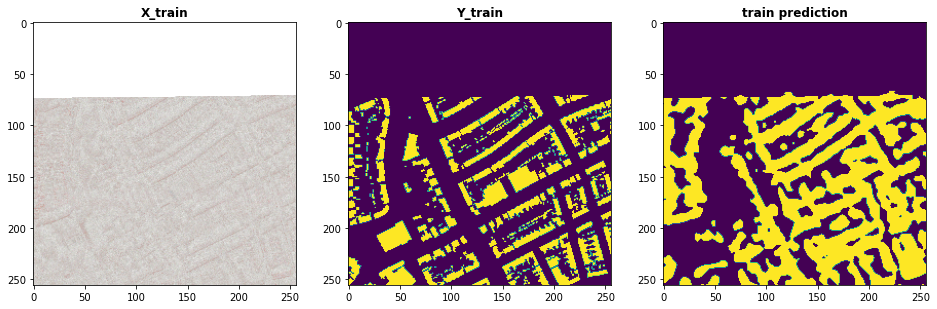

index: 55
val preds  set


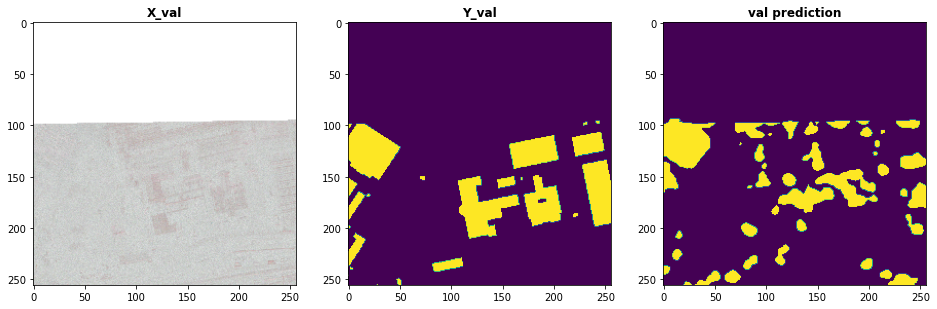

index: 75
test preds  set


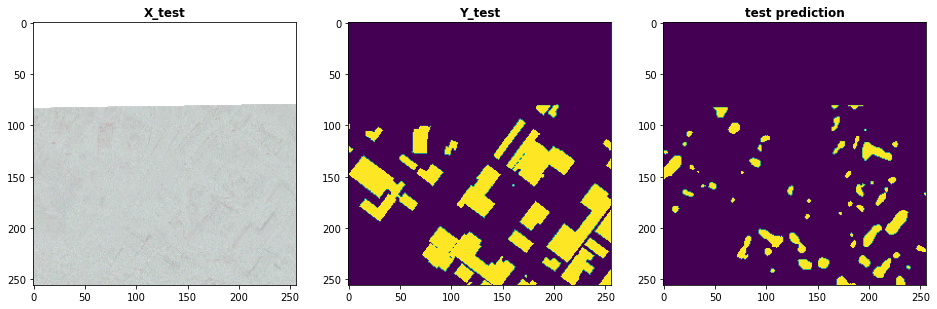

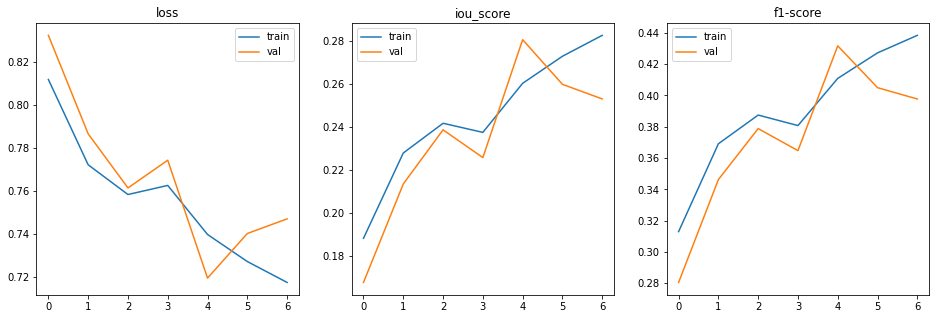

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### satellite_unet model. no pretrain, SAR only, loss: BinaryFocalLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'satellite_unet'
MODEL_PRETRAIN = None
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = satellite_unet(input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
model.compile(optimizer=MODEL_OPTIMIZER, loss=MODEL_LOSS, metrics=MODEL_METRICS)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, validation_split=MODEL_VAL_SPLIT, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, callbacks=callbacks)        

Epoch 1/20
45/45 [==============================] - 32s 709ms/step - loss: 0.0334 - iou_score: 0.0830 - f1-score: 0.1528 - val_loss: 0.0212 - val_iou_score: 0.0942 - val_f1-score: 0.1714
Epoch 2/20
45/45 [==============================] - 30s 676ms/step - loss: 0.0198 - iou_score: 0.0926 - f1-score: 0.1689 - val_loss: 0.0205 - val_iou_score: 0.0995 - val_f1-score: 0.1801
Epoch 3/20
45/45 [==============================] - 30s 667ms/step - loss: 0.0190 - iou_score: 0.0972 - f1-score: 0.1766 - val_loss: 0.0203 - val_iou_score: 0.1006 - val_f1-score: 0.1821
Epoch 4/20
45/45 [==============================] - 30s 674ms/step - loss: 0.0180 - iou_score: 0.1022 - f1-score: 0.1849 - val_loss: 0.0193 - val_iou_score: 0.1035 - val_f1-score: 0.1868
Epoch 5/20
45/45 [==============================] - 30s 670ms/step - loss: 0.0181 - iou_score: 0.1025 - f1-score: 0.1853 - val_loss: 0.0191 - val_iou_score: 0.1113 - val_f1-score: 0.1996
Epoch 6/20
45/45 [==============================] - 30s 669ms/ste

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

3/3 [==============================] - 1s 188ms/step
train set evaluation
23/23 [==============================] - 8s 349ms/step - loss: 0.0150 - iou_score: 0.1392 - f1-score: 0.2438
loss :  0.014977317303419113
iou_score :  0.13922636210918427
f1-score :  0.2438054233789444

validation set evaluation
3/3 [==============================] - 1s 196ms/step - loss: 24.4410 - iou_score: 0.1889 - f1-score: 0.3166
loss :  24.44102668762207
iou_score :  0.18887297809123993
f1-score :  0.31657350063323975

test set evaluation
3/3 [==============================] - 1s 189ms/step - loss: 0.0174 - iou_score: 0.1323 - f1-score: 0.2334
loss :  0.01743723824620247
iou_score :  0.13229835033416748
f1-score :  0.2334449738264084
saved model metrics


index: 440
train preds  set


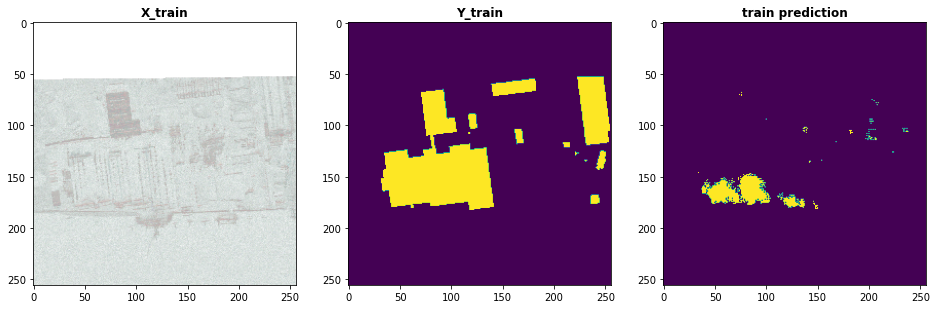

index: 35
val preds  set


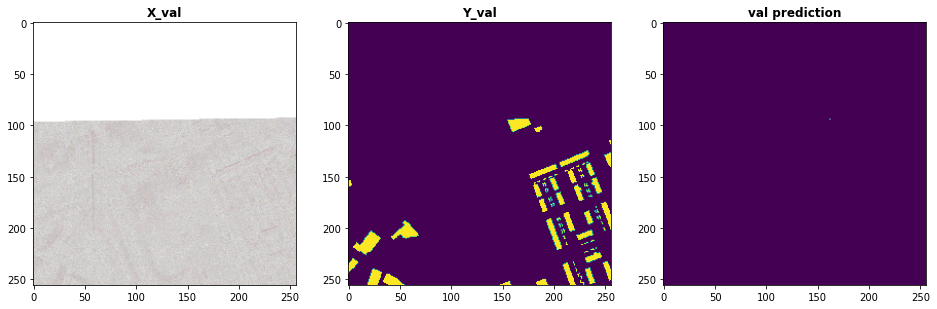

index: 24
test preds  set


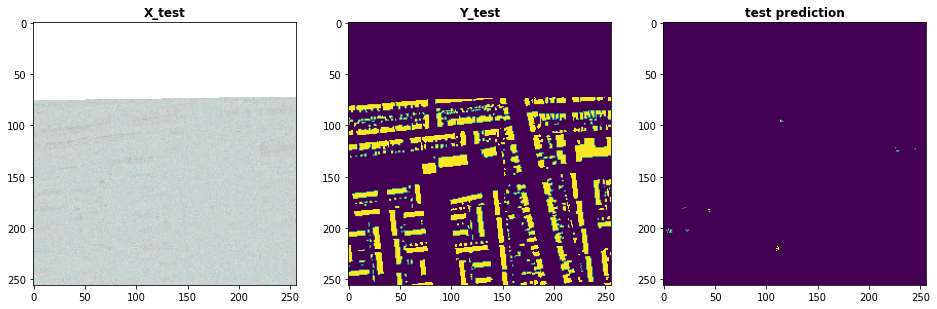

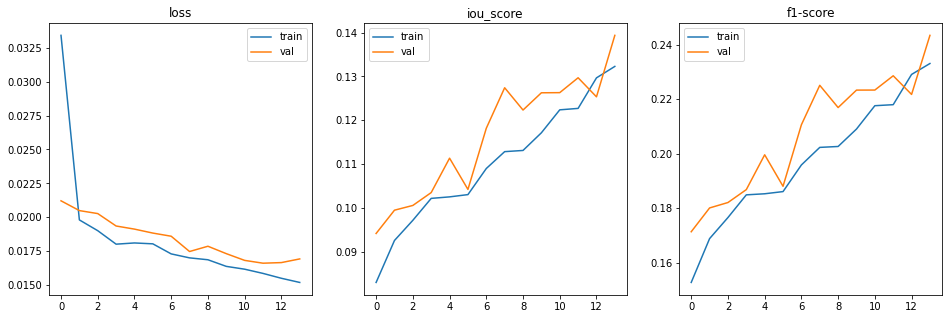

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain resnet34, SAR only, loss: jaccardLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 32s 44ms/step - loss: 0.8630 - iou_score: 0.1370 - f1-score: 0.2392 - val_loss: 0.9998 - val_iou_score: 1.8196e-04 - val_f1-score: 3.6381e-04
Epoch 2/20
720/720 [==============================] - 19s 27ms/step - loss: 0.8041 - iou_score: 0.1959 - f1-score: 0.3258 - val_loss: 0.9164 - val_iou_score: 0.0836 - val_f1-score: 0.1536
Epoch 3/20
720/720 [==============================] - 19s 26ms/step - loss: 0.7882 - iou_score: 0.2118 - f1-score: 0.3459 - val_loss: 0.9914 - val_iou_score: 0.0086 - val_f1-score: 0.0170
Epoch 4/20
720/720 [==============================] - 19s 26ms/step - loss: 0.7619 - iou_score: 0.2381 - f1-score: 0.3822 - val_loss: 0.9438 - val_iou_score: 0.0562 - val_f1-score: 0.1040
Epoch 5/20
720/720 [==============================] - 19s 26ms/step - loss: 0.7647 - iou_score: 0.2353 - f1-score: 0.3785 - val_loss: 0.8019 - val_iou_score: 0.1981 - val_f1-score: 0.3279
Epoch 6

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 7ms/step
train set evaluation
720/720 [==============================] - 5s 7ms/step
loss :  0.7528719676865472
iou_score :  0.2462962418794632
f1-score :  0.39158809185028076

validation set evaluation
80/80 [==============================] - 1s 7ms/step
loss :  0.5618100523948669
iou_score :  0.41250184178352356
f1-score :  0.5671965479850769

test set evaluation
80/80 [==============================] - 1s 7ms/step
loss :  0.7604816436767579
iou_score :  0.2303992509841919
f1-score :  0.37279510498046875
saved model metrics


index: 654
train preds  set


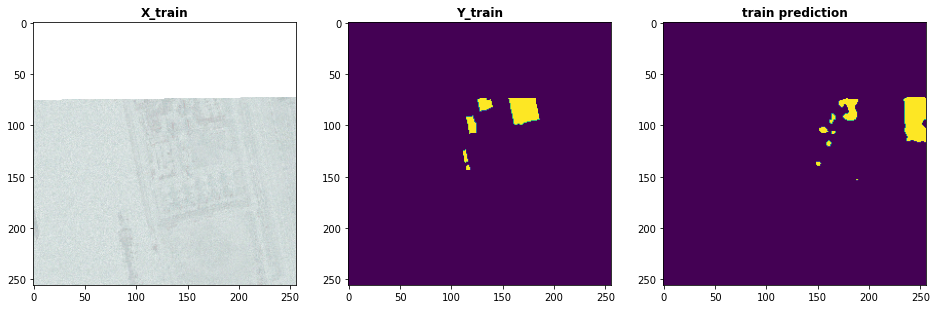

index: 70
val preds  set


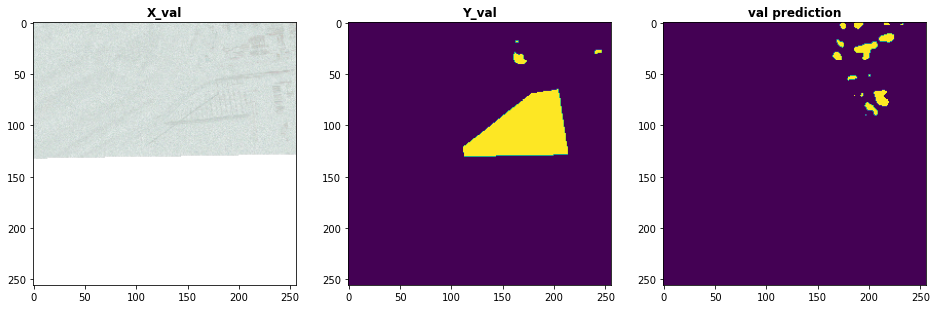

index: 55
test preds  set


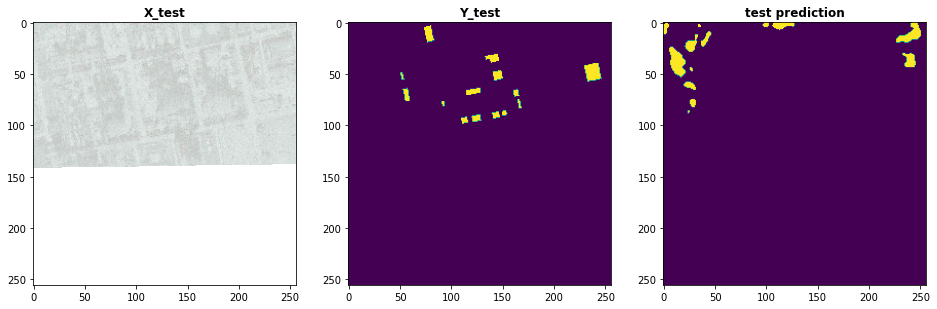

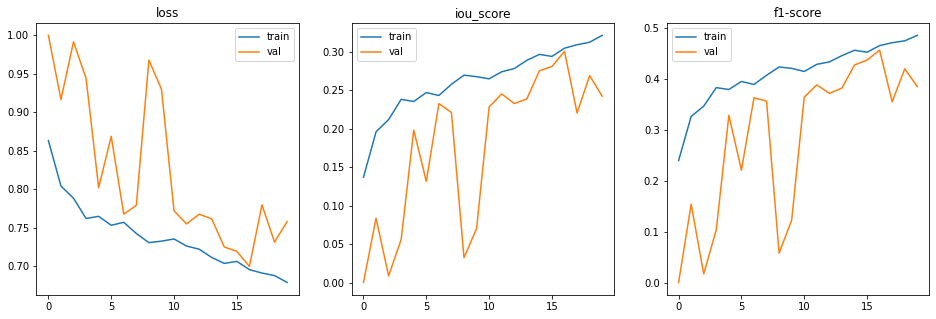

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain resnet34, SAR only, loss: BinaryFocalLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 29s 41ms/step - loss: 0.0333 - iou_score: 0.0705 - f1-score: 0.1311 - val_loss: 10.6302 - val_iou_score: 0.0768 - val_f1-score: 0.1418
Epoch 2/20
720/720 [==============================] - 19s 27ms/step - loss: 0.0187 - iou_score: 0.0849 - f1-score: 0.1562 - val_loss: 0.2899 - val_iou_score: 0.0099 - val_f1-score: 0.0196
Epoch 3/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0183 - iou_score: 0.0881 - f1-score: 0.1614 - val_loss: 0.0517 - val_iou_score: 0.0851 - val_f1-score: 0.1562
Epoch 4/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0182 - iou_score: 0.0884 - f1-score: 0.1619 - val_loss: 0.0247 - val_iou_score: 0.0960 - val_f1-score: 0.1745
Epoch 5/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0180 - iou_score: 0.0933 - f1-score: 0.1703 - val_loss: 0.0710 - val_iou_score: 0.0758 - val_f1-score: 0.1400
Epoch 6/20
720

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 7ms/step
train set evaluation
720/720 [==============================] - 5s 7ms/step
loss :  0.01617170928253068
iou_score :  0.12627045810222626
f1-score :  0.2236592024564743

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  27.89947624206543
iou_score :  0.16040736436843872
f1-score :  0.275485634803772

test set evaluation
80/80 [==============================] - 1s 7ms/step
loss :  0.018358922377228738
iou_score :  0.12327065318822861
f1-score :  0.21929676830768585
saved model metrics


index: 431
train preds  set


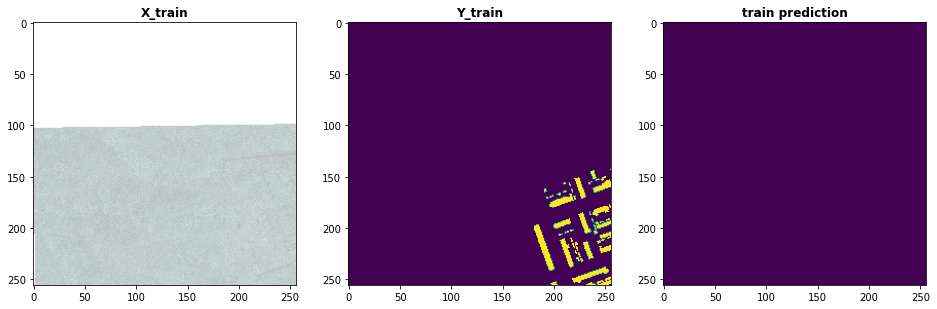

index: 70
val preds  set


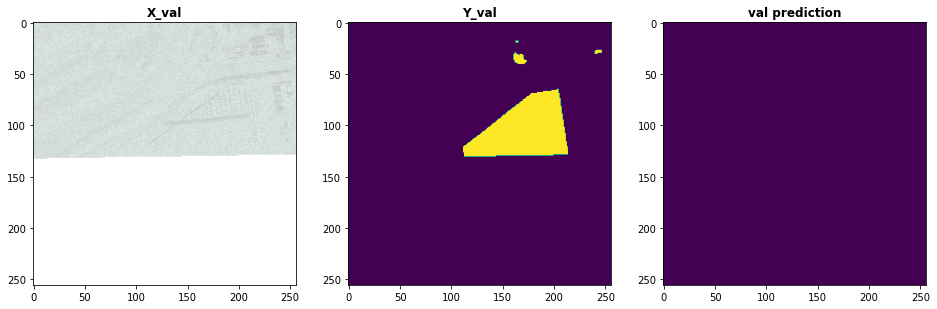

index: 38
test preds  set


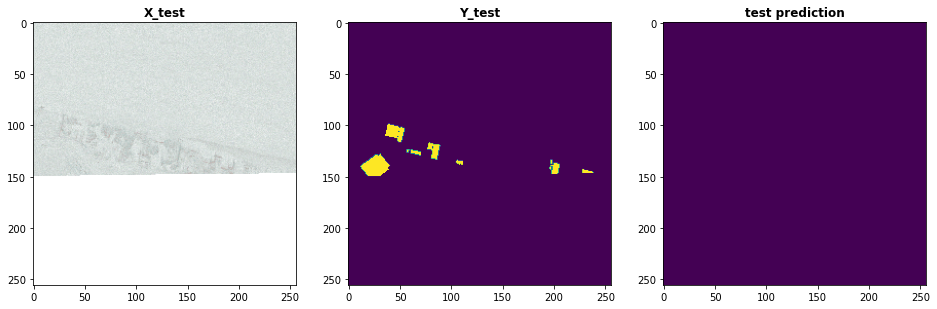

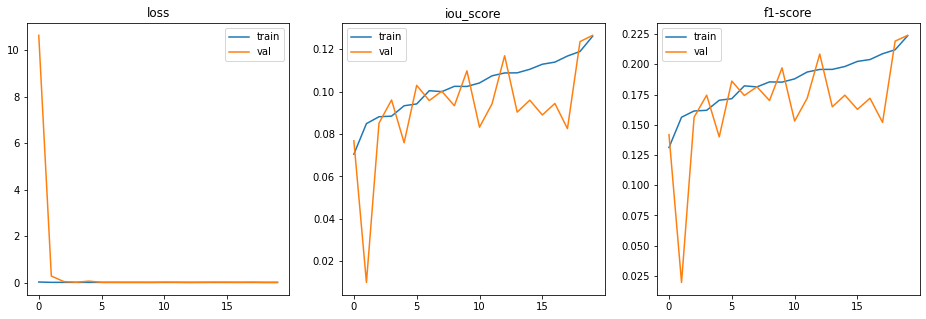

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain vgg16, SAR only, loss: jaccardLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'vgg16'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='vgg16', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 32s 44ms/step - loss: 0.8805 - iou_score: 0.1195 - f1-score: 0.2123 - val_loss: 0.8931 - val_iou_score: 0.1069 - val_f1-score: 0.1917
Epoch 2/20
720/720 [==============================] - 24s 33ms/step - loss: 0.8251 - iou_score: 0.1749 - f1-score: 0.2952 - val_loss: 0.8883 - val_iou_score: 0.1117 - val_f1-score: 0.1991
Epoch 3/20
720/720 [==============================] - 24s 33ms/step - loss: 0.7990 - iou_score: 0.2010 - f1-score: 0.3316 - val_loss: 0.9814 - val_iou_score: 0.0186 - val_f1-score: 0.0364
Epoch 4/20
720/720 [==============================] - 24s 33ms/step - loss: 0.7805 - iou_score: 0.2195 - f1-score: 0.3586 - val_loss: 0.8647 - val_iou_score: 0.1353 - val_f1-score: 0.2364
Epoch 5/20
720/720 [==============================] - 24s 33ms/step - loss: 0.7745 - iou_score: 0.2255 - f1-score: 0.3646 - val_loss: 0.8803 - val_iou_score: 0.1197 - val_f1-score: 0.2123
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 10ms/step
train set evaluation
720/720 [==============================] - 7s 10ms/step
loss :  0.9996520333819919
iou_score :  0.00034077322925440967
f1-score :  0.0006802856223657727

validation set evaluation
80/80 [==============================] - 1s 11ms/step
loss :  0.9999683141708374
iou_score :  3.04426303046057e-05
f1-score :  6.088292502681725e-05

test set evaluation
80/80 [==============================] - 1s 10ms/step
loss :  0.9999701976776123
iou_score :  3.372851278982125e-05
f1-score :  6.745421706000343e-05
saved model metrics


index: 701
train preds  set


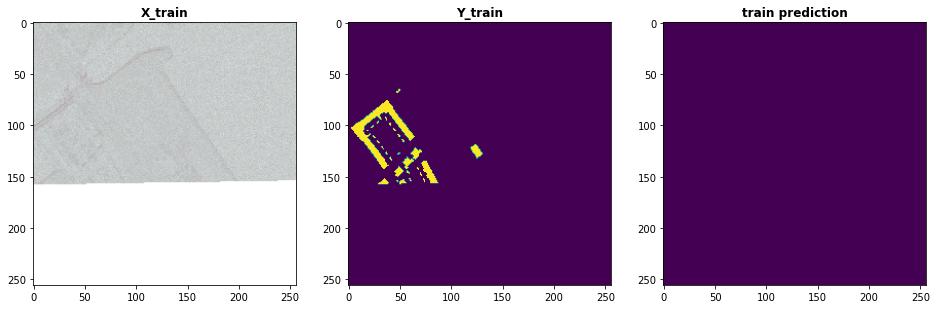

index: 55
val preds  set


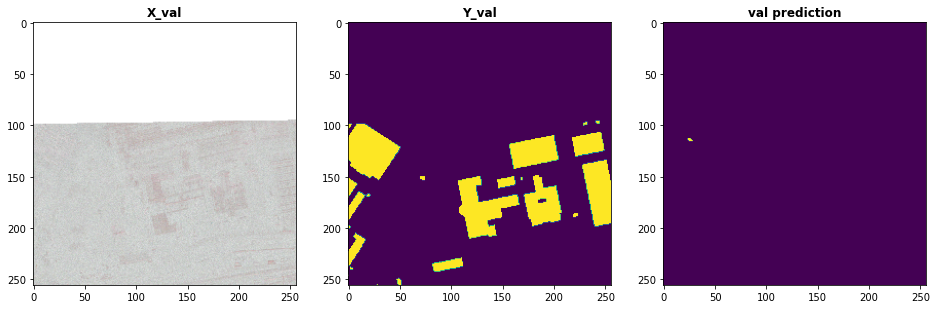

index: 65
test preds  set


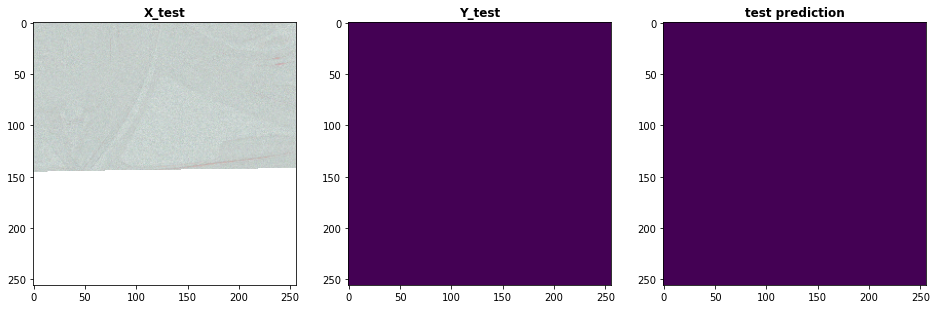

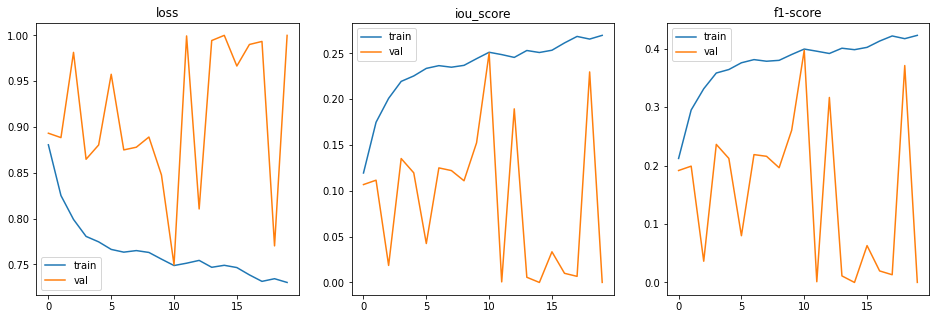

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain vgg16, SAR only, loss: BinaryFocalLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'vgg16'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='vgg16', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 26s 37ms/step - loss: 0.0438 - iou_score: 0.0664 - f1-score: 0.1241 - val_loss: 0.1225 - val_iou_score: 0.0040 - val_f1-score: 0.0080
Epoch 2/20
720/720 [==============================] - 24s 34ms/step - loss: 0.0205 - iou_score: 0.0745 - f1-score: 0.1384 - val_loss: 0.0533 - val_iou_score: 0.0298 - val_f1-score: 0.0576
Epoch 3/20
720/720 [==============================] - 24s 33ms/step - loss: 0.0197 - iou_score: 0.0790 - f1-score: 0.1461 - val_loss: 0.0261 - val_iou_score: 0.0785 - val_f1-score: 0.1447
Epoch 4/20
720/720 [==============================] - 24s 33ms/step - loss: 0.0192 - iou_score: 0.0838 - f1-score: 0.1540 - val_loss: 0.0228 - val_iou_score: 0.0841 - val_f1-score: 0.1543
Epoch 5/20
720/720 [==============================] - 24s 33ms/step - loss: 0.0190 - iou_score: 0.0861 - f1-score: 0.1580 - val_loss: 0.0263 - val_iou_score: 0.0885 - val_f1-score: 0.1619
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 10ms/step
train set evaluation
720/720 [==============================] - 7s 10ms/step
loss :  0.0188566106888983
iou_score :  0.0952034443616867
f1-score :  0.1734781265258789

validation set evaluation
80/80 [==============================] - 1s 11ms/step
loss :  18.46021728515625
iou_score :  0.2282457798719406
f1-score :  0.3713949918746948

test set evaluation
80/80 [==============================] - 1s 10ms/step
loss :  0.020477360859513283
iou_score :  0.0964553952217102
f1-score :  0.17579013109207153
saved model metrics


index: 35
train preds  set


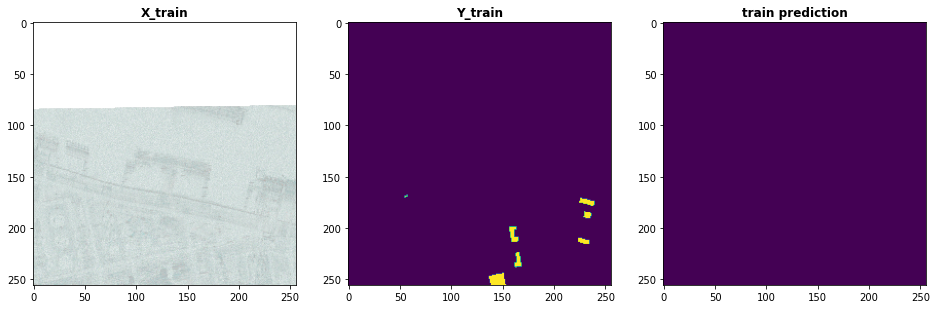

index: 55
val preds  set


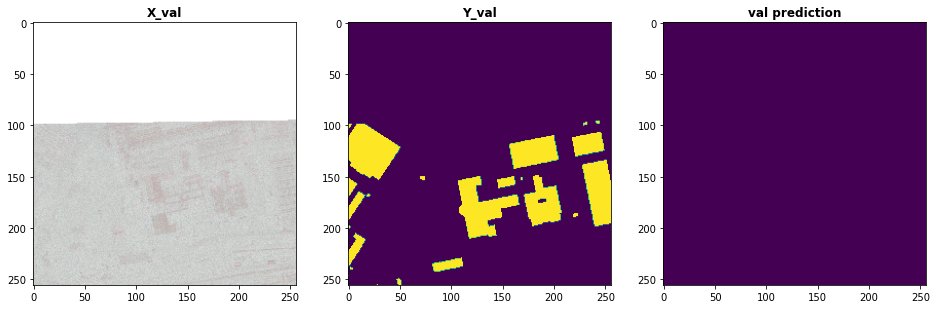

index: 8
test preds  set


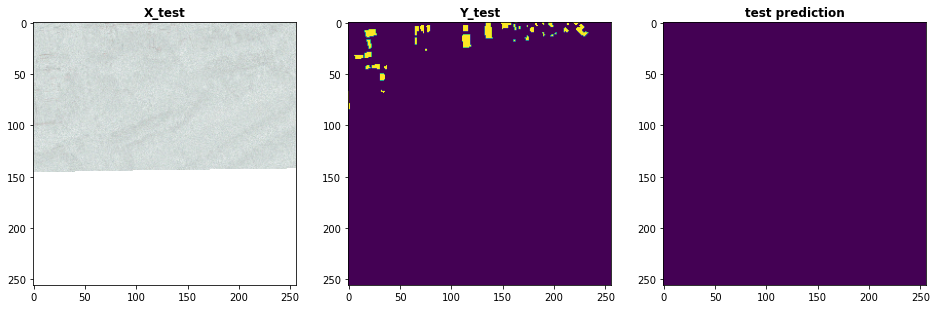

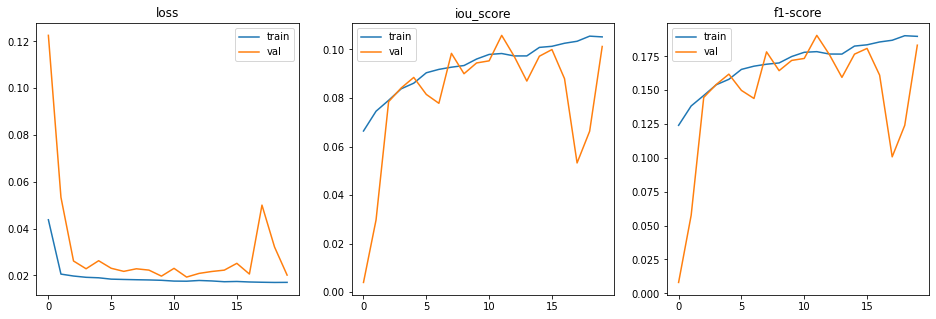

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain efficientnetb4, SAR only, loss: jaccardLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb4'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb4', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 99s 137ms/step - loss: 0.8635 - iou_score: 0.1365 - f1-score: 0.2383 - val_loss: 0.9139 - val_iou_score: 0.0861 - val_f1-score: 0.1574
Epoch 2/20
720/720 [==============================] - 50s 69ms/step - loss: 0.8032 - iou_score: 0.1968 - f1-score: 0.3271 - val_loss: 0.8822 - val_iou_score: 0.1178 - val_f1-score: 0.2094
Epoch 3/20
720/720 [==============================] - 50s 69ms/step - loss: 0.7721 - iou_score: 0.2279 - f1-score: 0.3691 - val_loss: 0.9120 - val_iou_score: 0.0880 - val_f1-score: 0.1607
Epoch 4/20
720/720 [==============================] - 50s 70ms/step - loss: 0.7528 - iou_score: 0.2472 - f1-score: 0.3946 - val_loss: 0.8629 - val_iou_score: 0.1371 - val_f1-score: 0.2399
Epoch 5/20
720/720 [==============================] - 50s 69ms/step - loss: 0.7316 - iou_score: 0.2684 - f1-score: 0.4213 - val_loss: 0.9841 - val_iou_score: 0.0159 - val_f1-score: 0.0312
Epoch 6/20
720

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 14ms/step
train set evaluation
720/720 [==============================] - 10s 14ms/step
loss :  0.5903422620561388
iou_score :  0.40918442606925964
f1-score :  0.5794801115989685

validation set evaluation
80/80 [==============================] - 1s 14ms/step
loss :  0.9034616351127625
iou_score :  0.09920108318328857
f1-score :  0.1801549345254898

test set evaluation
80/80 [==============================] - 1s 14ms/step
loss :  0.6897136092185974
iou_score :  0.3055155873298645
f1-score :  0.46732696890830994
saved model metrics


index: 230
train preds  set


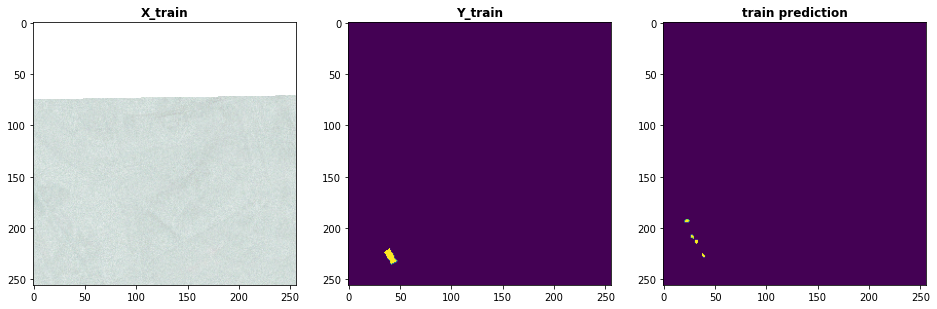

index: 50
val preds  set


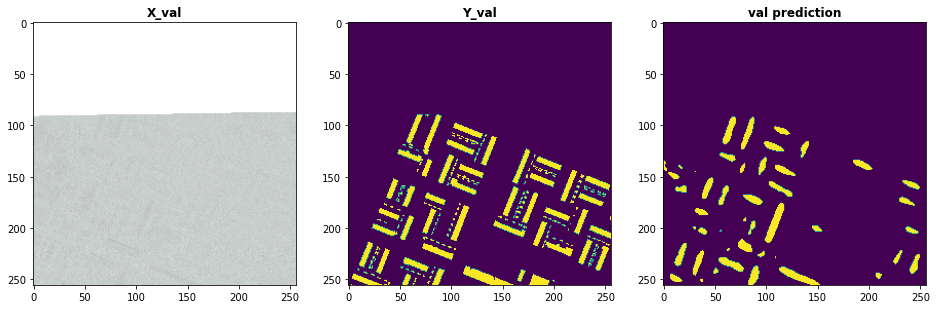

index: 49
test preds  set


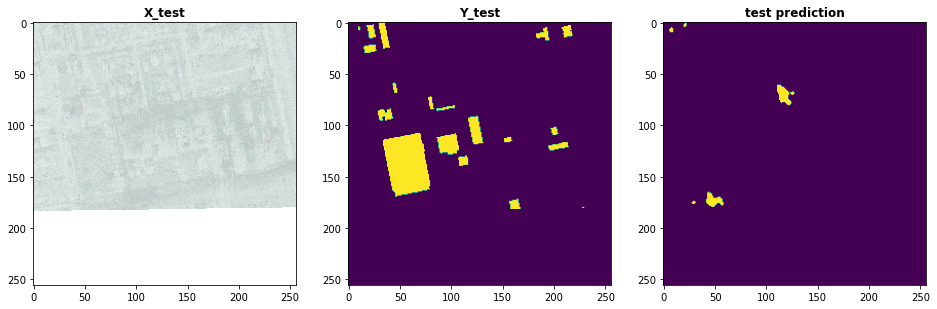

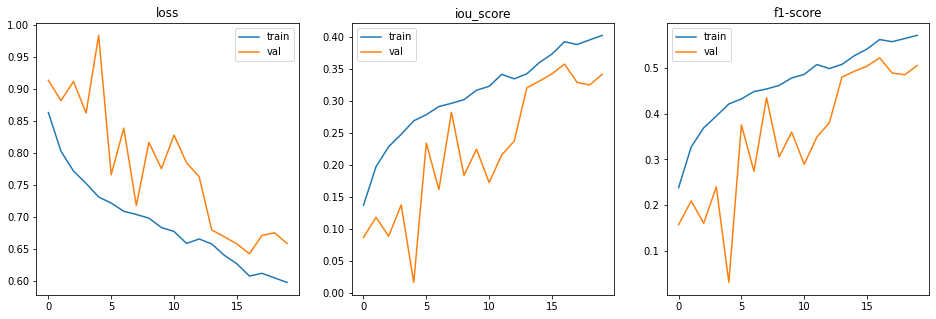

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain efficientnetb4, SAR only, loss: BinaryFocalLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb4'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb4', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 95s 132ms/step - loss: 0.0393 - iou_score: 0.0675 - f1-score: 0.1261 - val_loss: 0.2644 - val_iou_score: 0.0041 - val_f1-score: 0.0081
Epoch 2/20
720/720 [==============================] - 50s 69ms/step - loss: 0.0192 - iou_score: 0.0814 - f1-score: 0.1502 - val_loss: 0.0567 - val_iou_score: 0.0429 - val_f1-score: 0.0818
Epoch 3/20
720/720 [==============================] - 50s 70ms/step - loss: 0.0185 - iou_score: 0.0870 - f1-score: 0.1597 - val_loss: 0.0300 - val_iou_score: 0.0675 - val_f1-score: 0.1261
Epoch 4/20
720/720 [==============================] - 50s 69ms/step - loss: 0.0183 - iou_score: 0.0890 - f1-score: 0.1629 - val_loss: 0.0224 - val_iou_score: 0.0885 - val_f1-score: 0.1620
Epoch 5/20
720/720 [==============================] - 50s 70ms/step - loss: 0.0180 - iou_score: 0.0917 - f1-score: 0.1674 - val_loss: 0.0279 - val_iou_score: 0.0938 - val_f1-score: 0.1708
Epoch 6/20
720

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 14ms/step
train set evaluation
720/720 [==============================] - 10s 14ms/step
loss :  0.01522729734165801
iou_score :  0.1351369470357895
f1-score :  0.2374950349330902

validation set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  17.038930130004882
iou_score :  0.2779148519039154
f1-score :  0.43406131863594055

test set evaluation
80/80 [==============================] - 1s 14ms/step
loss :  0.018503527343273162
iou_score :  0.12361416965723038
f1-score :  0.21973268687725067
saved model metrics


index: 502
train preds  set


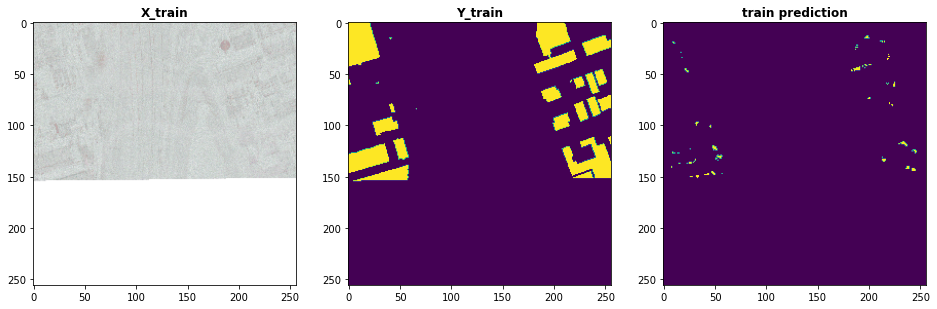

index: 1
val preds  set


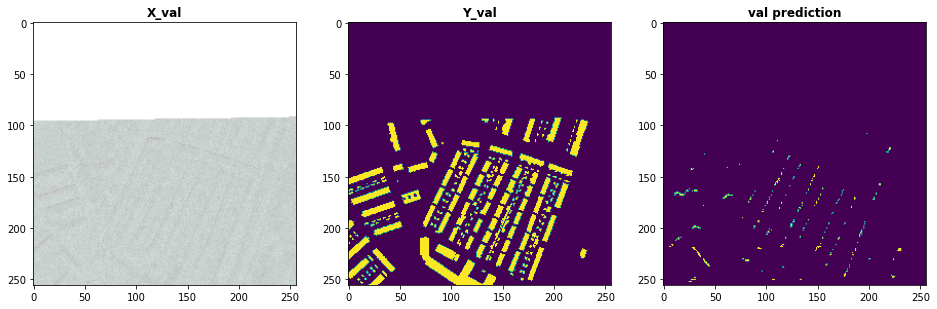

index: 5
test preds  set


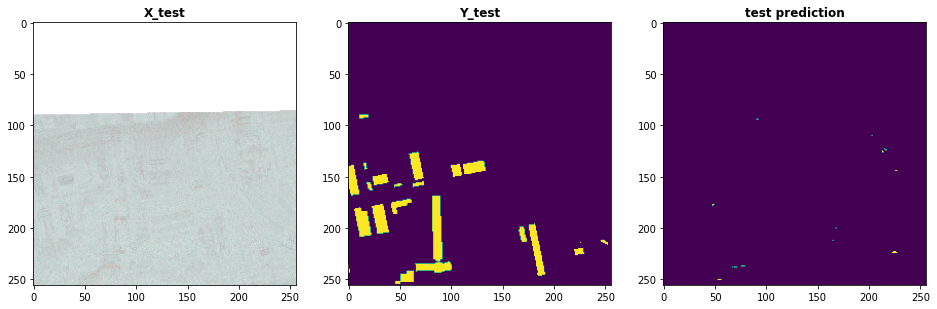

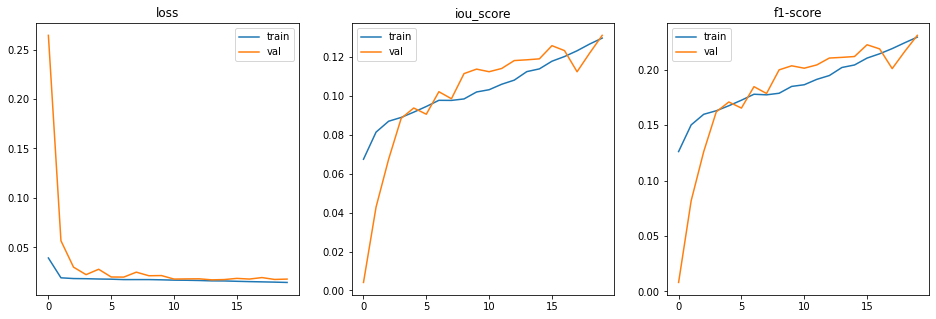

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain efficientnetb0, SAR only, loss: jaccardLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 47s 65ms/step - loss: 0.8661 - iou_score: 0.1339 - f1-score: 0.2338 - val_loss: 0.8845 - val_iou_score: 0.1155 - val_f1-score: 0.2058
Epoch 2/20
720/720 [==============================] - 26s 36ms/step - loss: 0.8005 - iou_score: 0.1995 - f1-score: 0.3314 - val_loss: 0.8807 - val_iou_score: 0.1193 - val_f1-score: 0.2119
Epoch 3/20
720/720 [==============================] - 25s 35ms/step - loss: 0.7743 - iou_score: 0.2257 - f1-score: 0.3661 - val_loss: 0.8569 - val_iou_score: 0.1431 - val_f1-score: 0.2483
Epoch 4/20
720/720 [==============================] - 26s 36ms/step - loss: 0.7567 - iou_score: 0.2433 - f1-score: 0.3896 - val_loss: 0.9092 - val_iou_score: 0.0908 - val_f1-score: 0.1651
Epoch 5/20
720/720 [==============================] - 26s 36ms/step - loss: 0.7470 - iou_score: 0.2530 - f1-score: 0.4011 - val_loss: 0.7809 - val_iou_score: 0.2191 - val_f1-score: 0.3560
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 6s 8ms/step
loss :  0.607179946369595
iou_score :  0.3921048045158386
f1-score :  0.5625317692756653

validation set evaluation
80/80 [==============================] - 1s 9ms/step
loss :  0.8480033993721008
iou_score :  0.16169141232967377
f1-score :  0.27653178572654724

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.7029628992080689
iou_score :  0.2930103838443756
f1-score :  0.4518149793148041
saved model metrics


index: 99
train preds  set


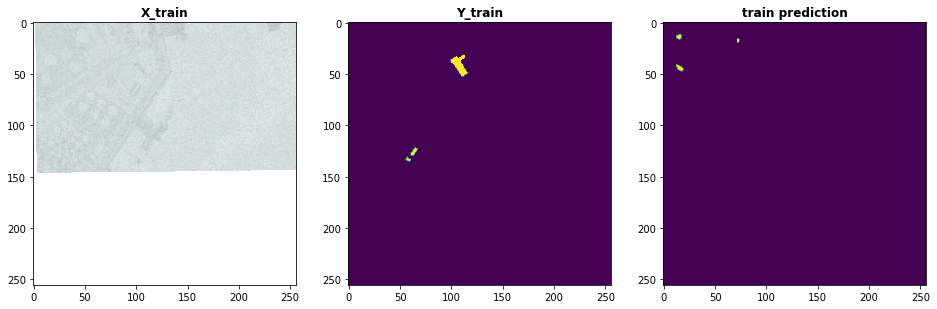

index: 7
val preds  set


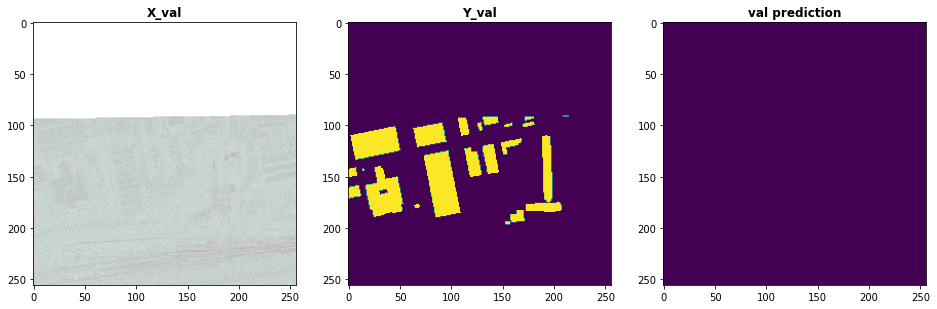

index: 70
test preds  set


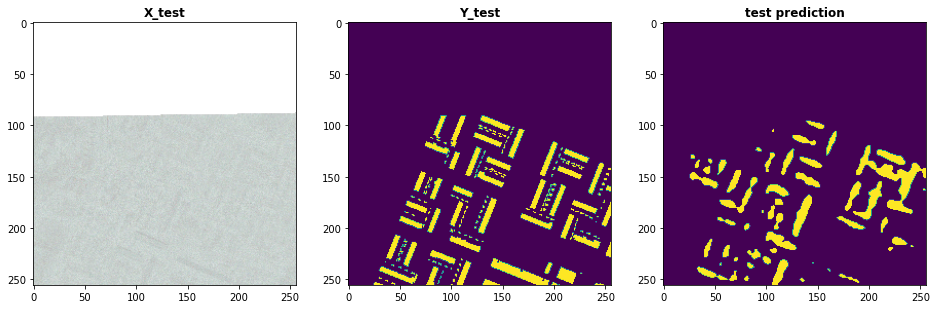

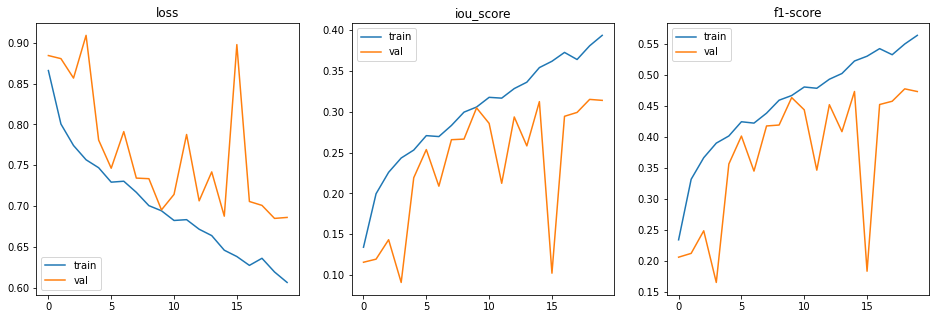

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain efficientnetb0, SAR only, loss: BinaryFocalLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 44s 62ms/step - loss: 0.0454 - iou_score: 0.0681 - f1-score: 0.1270 - val_loss: 0.2109 - val_iou_score: 0.0643 - val_f1-score: 0.1199
Epoch 2/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0196 - iou_score: 0.0769 - f1-score: 0.1424 - val_loss: 0.0480 - val_iou_score: 0.0636 - val_f1-score: 0.1191
Epoch 3/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0187 - iou_score: 0.0828 - f1-score: 0.1525 - val_loss: 0.0249 - val_iou_score: 0.0695 - val_f1-score: 0.1295
Epoch 4/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0182 - iou_score: 0.0874 - f1-score: 0.1603 - val_loss: 0.0253 - val_iou_score: 0.0638 - val_f1-score: 0.1197
Epoch 5/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0181 - iou_score: 0.0889 - f1-score: 0.1627 - val_loss: 0.0265 - val_iou_score: 0.0653 - val_f1-score: 0.1225
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 6s 8ms/step
loss :  0.015111634466383193
iou_score :  0.1466626673936844
f1-score :  0.2552393674850464

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  16.044486808776856
iou_score :  0.29311421513557434
f1-score :  0.45256873965263367

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.020197175070643426
iou_score :  0.11940222233533859
f1-score :  0.21312223374843597
saved model metrics


index: 306
train preds  set


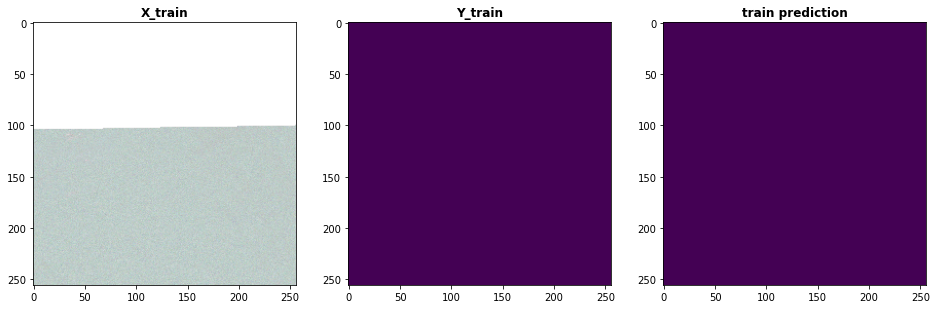

index: 23
val preds  set


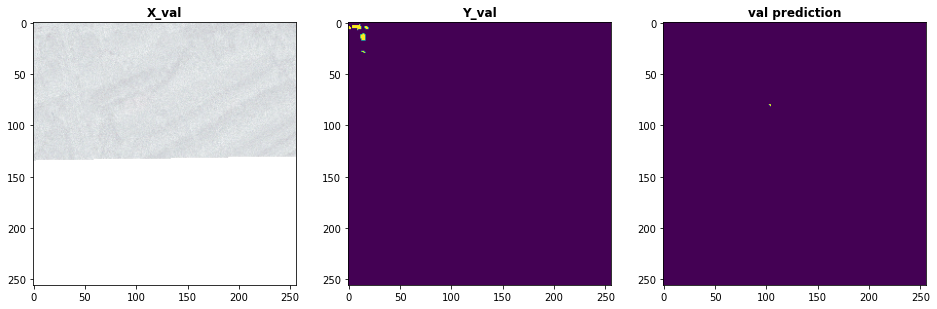

index: 25
test preds  set


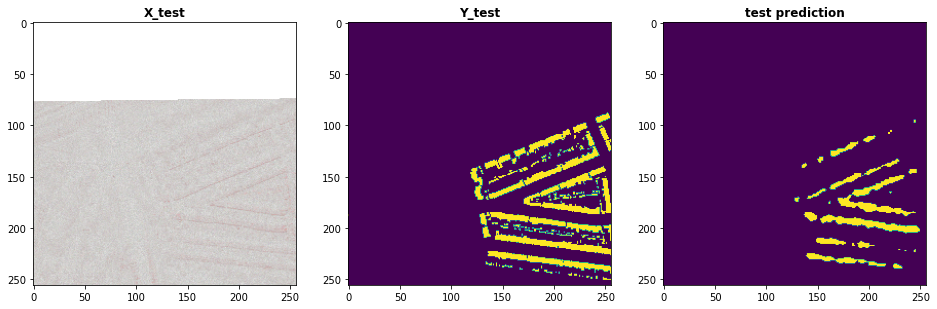

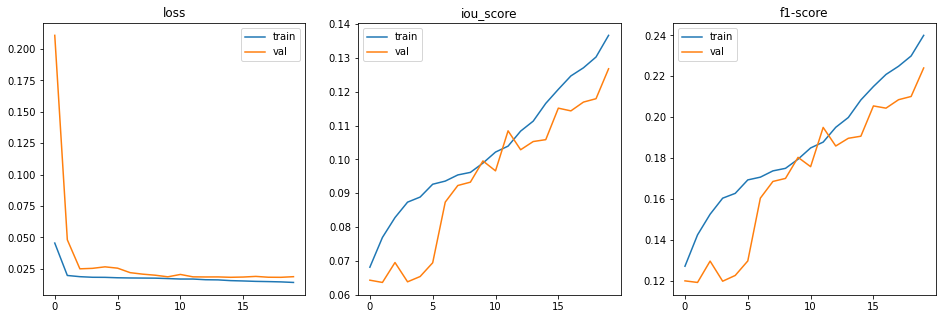

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain densenet201, SAR only, loss: jaccardLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'densenet201'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='densenet201', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 151s 209ms/step - loss: 0.8622 - iou_score: 0.1378 - f1-score: 0.2404 - val_loss: 0.9852 - val_iou_score: 0.0148 - val_f1-score: 0.0292
Epoch 2/20
720/720 [==============================] - 50s 70ms/step - loss: 0.8161 - iou_score: 0.1839 - f1-score: 0.3078 - val_loss: 0.9604 - val_iou_score: 0.0396 - val_f1-score: 0.0760
Epoch 3/20
720/720 [==============================] - 50s 70ms/step - loss: 0.7871 - iou_score: 0.2129 - f1-score: 0.3483 - val_loss: 0.8985 - val_iou_score: 0.1015 - val_f1-score: 0.1829
Epoch 4/20
720/720 [==============================] - 50s 69ms/step - loss: 0.7815 - iou_score: 0.2185 - f1-score: 0.3556 - val_loss: 0.9398 - val_iou_score: 0.0602 - val_f1-score: 0.1136
Epoch 5/20
720/720 [==============================] - 50s 70ms/step - loss: 0.7671 - iou_score: 0.2329 - f1-score: 0.3757 - val_loss: 0.9157 - val_iou_score: 0.0843 - val_f1-score: 0.1545
Epoch 6/20
72

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 16ms/step
train set evaluation
720/720 [==============================] - 12s 16ms/step
loss :  0.8332174234920078
iou_score :  0.16634638607501984
f1-score :  0.28345826268196106

validation set evaluation
80/80 [==============================] - 1s 17ms/step
loss :  0.8342432975769043
iou_score :  0.17720048129558563
f1-score :  0.29868170619010925

test set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.8265556335449219
iou_score :  0.1703801155090332
f1-score :  0.29066041111946106
saved model metrics


index: 407
train preds  set


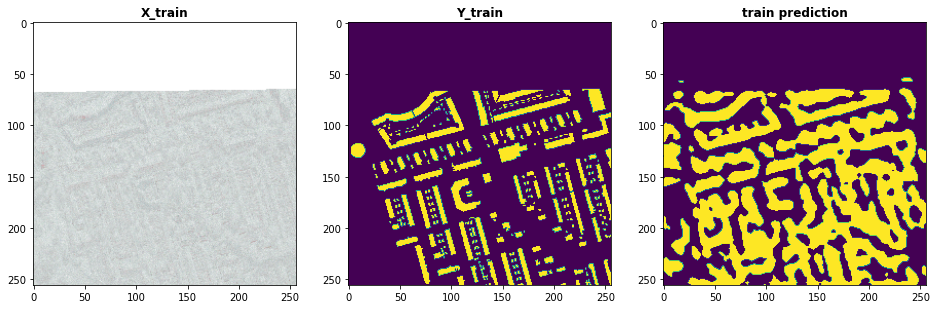

index: 13
val preds  set


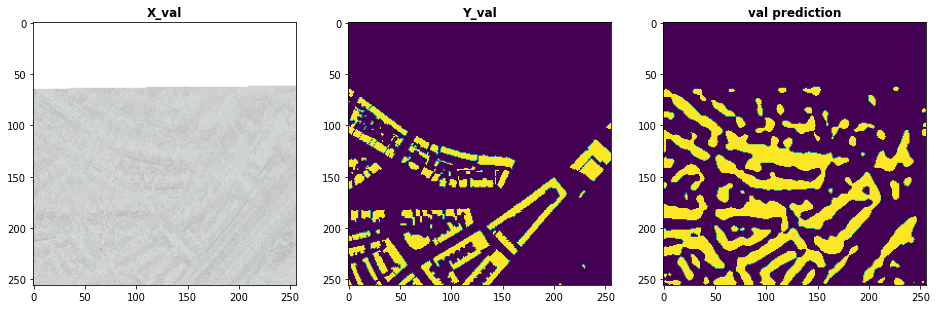

index: 43
test preds  set


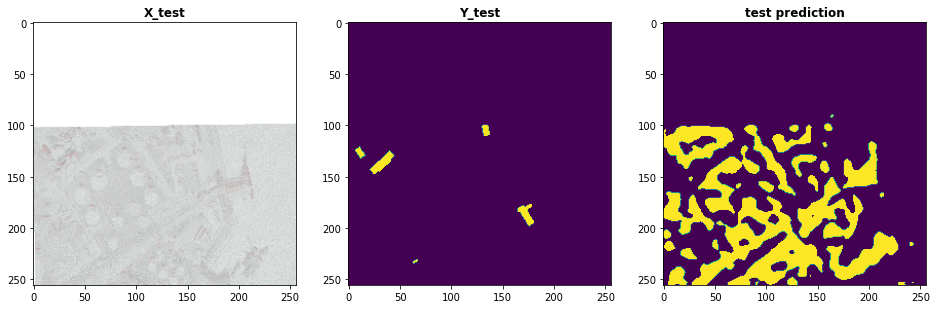

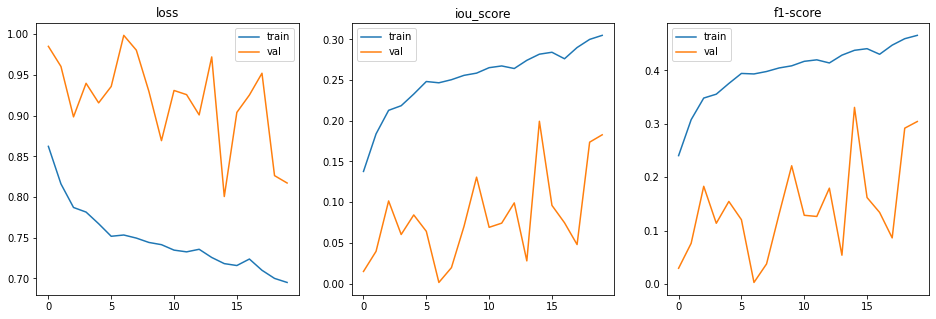

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain densenet201, SAR only, loss: BinaryFocalLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'densenet201'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='densenet201', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 147s 204ms/step - loss: 0.0356 - iou_score: 0.0696 - f1-score: 0.1296 - val_loss: 10.1341 - val_iou_score: 0.0612 - val_f1-score: 0.1140
Epoch 2/20
720/720 [==============================] - 50s 70ms/step - loss: 0.0204 - iou_score: 0.0772 - f1-score: 0.1430 - val_loss: 0.0194 - val_iou_score: 0.0620 - val_f1-score: 0.1159
Epoch 3/20
720/720 [==============================] - 50s 69ms/step - loss: 0.0198 - iou_score: 0.0816 - f1-score: 0.1505 - val_loss: 0.0229 - val_iou_score: 0.0727 - val_f1-score: 0.1343
Epoch 4/20
720/720 [==============================] - 50s 69ms/step - loss: 0.0190 - iou_score: 0.0874 - f1-score: 0.1604 - val_loss: 0.0200 - val_iou_score: 0.0678 - val_f1-score: 0.1260
Epoch 5/20
720/720 [==============================] - 50s 69ms/step - loss: 0.0191 - iou_score: 0.0883 - f1-score: 0.1619 - val_loss: 0.0245 - val_iou_score: 0.0595 - val_f1-score: 0.1117
Epoch 6/20
7

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 16ms/step
train set evaluation
720/720 [==============================] - 12s 16ms/step
loss :  0.018322323718004758
iou_score :  0.10010571032762527
f1-score :  0.1814914345741272

validation set evaluation
80/80 [==============================] - 1s 17ms/step
loss :  14.16351776123047
iou_score :  0.2707364559173584
f1-score :  0.4257095754146576

test set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.01867367886006832
iou_score :  0.11292863637208939
f1-score :  0.20255576074123383
saved model metrics


index: 446
train preds  set


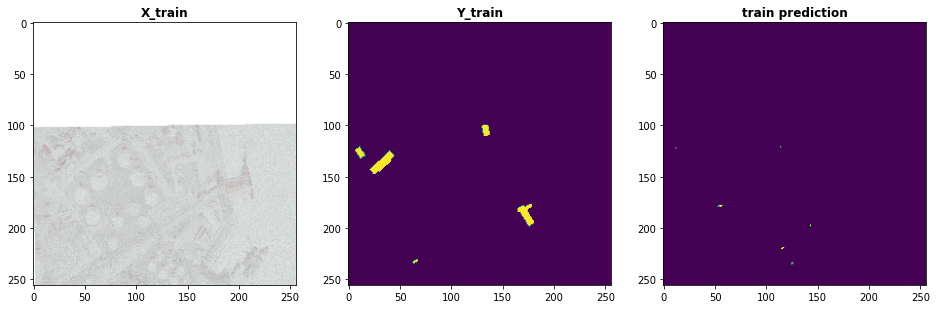

index: 5
val preds  set


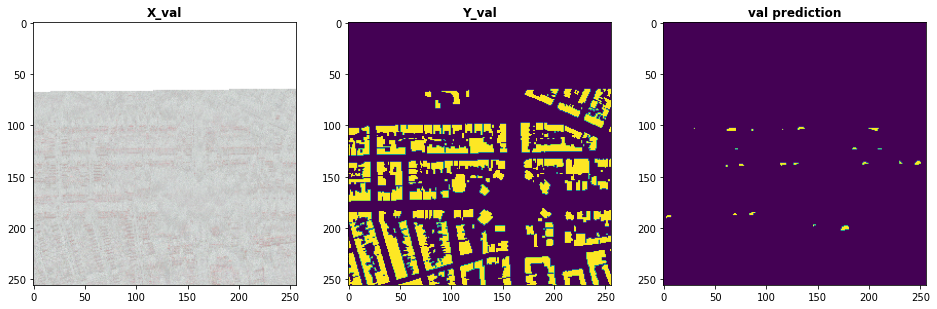

index: 20
test preds  set


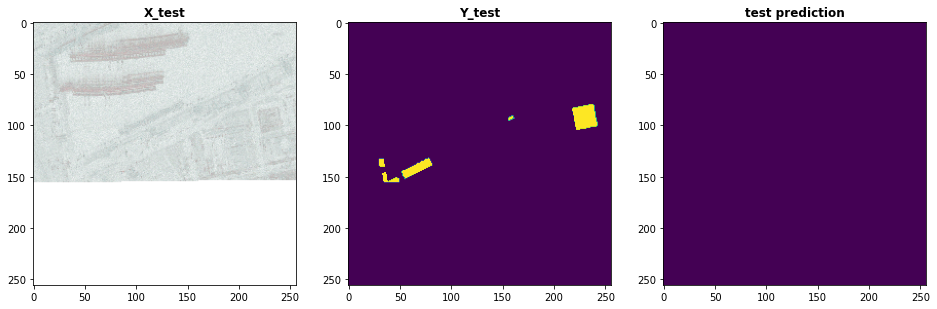

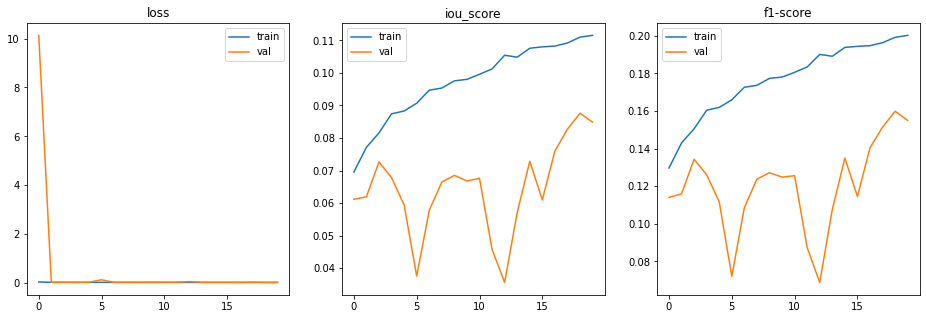

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

# Explore PS-RGBNIR data

## Bring in actual ps rgbnir data

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('PS-RGBNIR', 256, 256)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK = gen_paths(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK, IMG_HEIGHT, IMG_WIDTH)
X_train_psrgbnir, Y_train_psrgbnir, X_test_psrgbnir, Y_test_psrgbnir = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)

Resized images and masks available


  0%|          | 0/800 [00:00<?, ?it/s]

formatting training images


  0%|          | 0/800 [00:00<?, ?it/s]

Finished formatting training images
formatting training masks


  0%|          | 0/80 [00:00<?, ?it/s]

Finished formatting training masks
formatting test images


  0%|          | 0/80 [00:00<?, ?it/s]

Finished formatting test images
formatting test masks


100%|██████████| 80/80 [00:25<00:00,  3.17it/s]

Finished formatting test masks


In [ ]:
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('PS-RGBNIR', 256, 256)       # CHANGE HERE
X_train = X_train_psrgbnir
Y_train = Y_train_psrgbnir
X_test = X_test_psrgbnir
Y_test = Y_test_psrgbnir

## Train our various models and loss functions

### satellite_unet model. no pretrain, PS-RGBNIR only, loss: jaccardLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'satellite_unet'
MODEL_PRETRAIN = None
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = satellite_unet(input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
model.compile(optimizer=MODEL_OPTIMIZER, loss=MODEL_LOSS, metrics=MODEL_METRICS)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, validation_split=MODEL_VAL_SPLIT, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, callbacks=callbacks)        

Epoch 1/20
45/45 [==============================] - 33s 737ms/step - loss: 0.7011 - iou_score: 0.2989 - f1-score: 0.4521 - val_loss: 0.5717 - val_iou_score: 0.4283 - val_f1-score: 0.5985
Epoch 2/20
45/45 [==============================] - 30s 672ms/step - loss: 0.5533 - iou_score: 0.4467 - f1-score: 0.6157 - val_loss: 0.5094 - val_iou_score: 0.4906 - val_f1-score: 0.6559
Epoch 3/20
45/45 [==============================] - 30s 663ms/step - loss: 0.5188 - iou_score: 0.4812 - f1-score: 0.6484 - val_loss: 0.5228 - val_iou_score: 0.4772 - val_f1-score: 0.6418
Epoch 4/20
45/45 [==============================] - 30s 669ms/step - loss: 0.4843 - iou_score: 0.5157 - f1-score: 0.6780 - val_loss: 0.5635 - val_iou_score: 0.4365 - val_f1-score: 0.6032


In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

3/3 [==============================] - 1s 196ms/step
train set evaluation
23/23 [==============================] - 8s 367ms/step - loss: 0.5279 - iou_score: 0.4731 - f1-score: 0.6417
loss :  0.5278977155685425
iou_score :  0.4731272757053375
f1-score :  0.6416563987731934

validation set evaluation
3/3 [==============================] - 1s 204ms/step - loss: 0.8246 - iou_score: 0.1710 - f1-score: 0.2899
loss :  0.8245980143547058
iou_score :  0.1710456758737564
f1-score :  0.2898682653903961

test set evaluation
3/3 [==============================] - 1s 196ms/step - loss: 0.5093 - iou_score: 0.4979 - f1-score: 0.6642
loss :  0.5093187093734741
iou_score :  0.4979311227798462
f1-score :  0.6642020344734192
saved model metrics


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 234
train preds  set


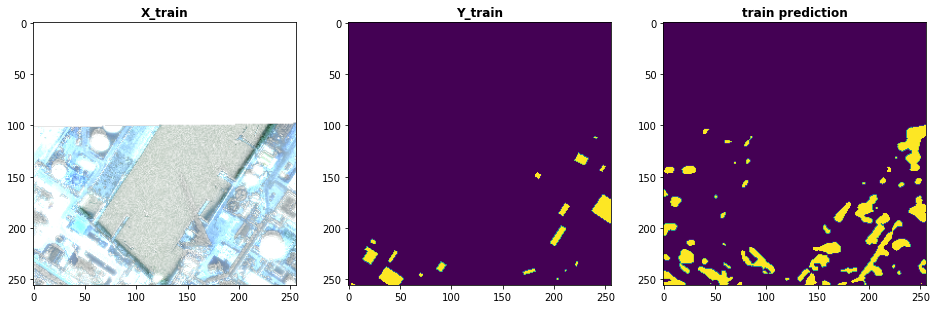

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 40
val preds  set


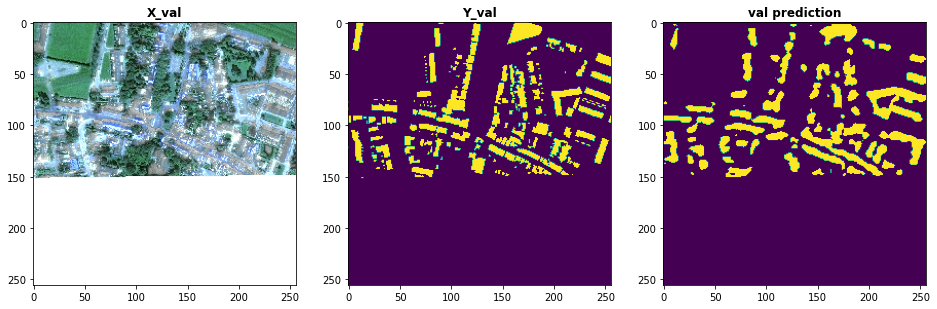

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 51
test preds  set


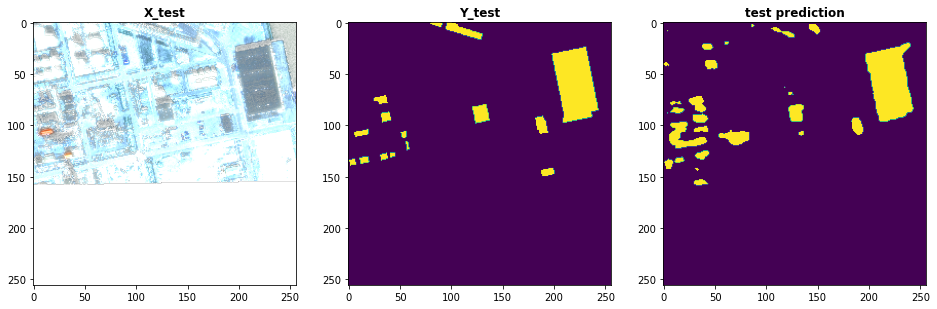

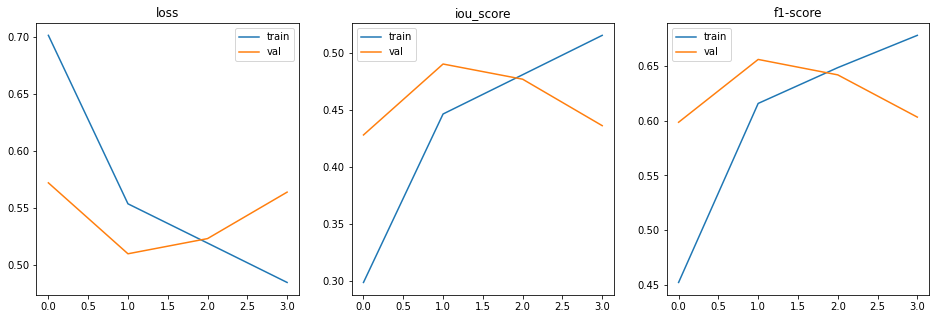

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### satellite_unet model. no pretrain, PS-RGBNIR only, loss: BinaryFocalLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'satellite_unet'
MODEL_PRETRAIN = None
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = satellite_unet(input_shape=(IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS))
model.compile(optimizer=MODEL_OPTIMIZER, loss=MODEL_LOSS, metrics=MODEL_METRICS)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, validation_split=MODEL_VAL_SPLIT, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, callbacks=callbacks)        

Epoch 1/20
45/45 [==============================] - 32s 704ms/step - loss: 0.0485 - iou_score: 0.1012 - f1-score: 0.1832 - val_loss: 0.0164 - val_iou_score: 0.1098 - val_f1-score: 0.1962
Epoch 2/20
45/45 [==============================] - 30s 675ms/step - loss: 0.0170 - iou_score: 0.1302 - f1-score: 0.2297 - val_loss: 0.0180 - val_iou_score: 0.1341 - val_f1-score: 0.2345
Epoch 3/20
45/45 [==============================] - 30s 667ms/step - loss: 0.0145 - iou_score: 0.1562 - f1-score: 0.2694 - val_loss: 0.0120 - val_iou_score: 0.1392 - val_f1-score: 0.2426
Epoch 4/20
45/45 [==============================] - 30s 672ms/step - loss: 0.0137 - iou_score: 0.1680 - f1-score: 0.2868 - val_loss: 0.0102 - val_iou_score: 0.1771 - val_f1-score: 0.2985
Epoch 5/20
45/45 [==============================] - 30s 672ms/step - loss: 0.0119 - iou_score: 0.1890 - f1-score: 0.3174 - val_loss: 0.0100 - val_iou_score: 0.1919 - val_f1-score: 0.3197
Epoch 6/20
45/45 [==============================] - 30s 670ms/ste

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

3/3 [==============================] - 1s 196ms/step
train set evaluation
23/23 [==============================] - 8s 369ms/step - loss: 0.0113 - iou_score: 0.2035 - f1-score: 0.3377
loss :  0.01130085252225399
iou_score :  0.20349374413490295
f1-score :  0.337670236825943

validation set evaluation
3/3 [==============================] - 1s 202ms/step - loss: 57.1932 - iou_score: 0.2183 - f1-score: 0.3568
loss :  57.193214416503906
iou_score :  0.2183191031217575
f1-score :  0.3568096160888672

test set evaluation
3/3 [==============================] - 1s 193ms/step - loss: 0.0119 - iou_score: 0.2140 - f1-score: 0.3521
loss :  0.011949419043958187
iou_score :  0.2139839380979538
f1-score :  0.3521219491958618
saved model metrics


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 552
train preds  set


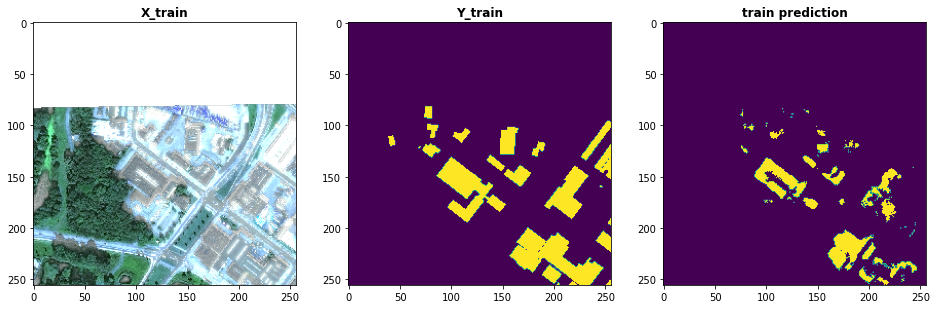

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 39
val preds  set


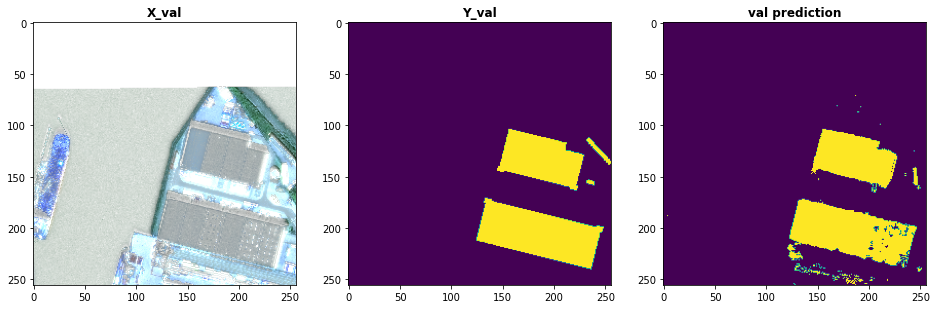

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 63
test preds  set


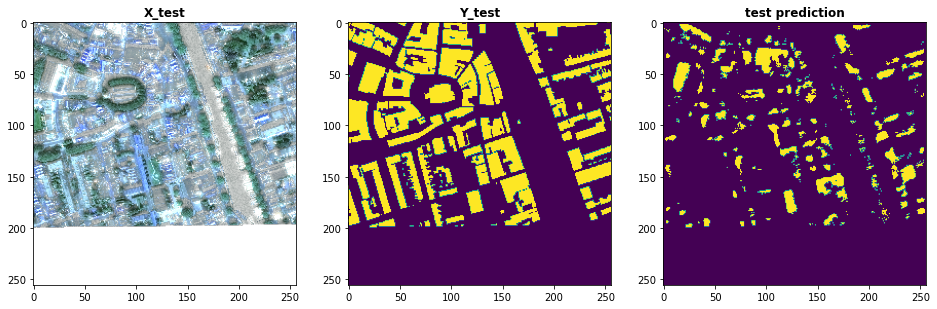

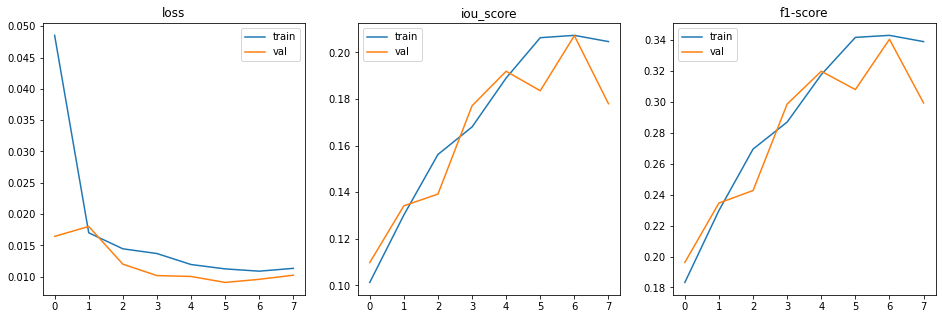

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain resnet34, PS-RGBNIR only, loss: jaccardLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 32s 44ms/step - loss: 0.7964 - iou_score: 0.2036 - f1-score: 0.3328 - val_loss: 0.9967 - val_iou_score: 0.0033 - val_f1-score: 0.0065
Epoch 2/20
720/720 [==============================] - 19s 27ms/step - loss: 0.6341 - iou_score: 0.3659 - f1-score: 0.5336 - val_loss: 0.9967 - val_iou_score: 0.0033 - val_f1-score: 0.0066
Epoch 3/20
720/720 [==============================] - 19s 27ms/step - loss: 0.5622 - iou_score: 0.4378 - f1-score: 0.6077 - val_loss: 0.9519 - val_iou_score: 0.0481 - val_f1-score: 0.0914
Epoch 4/20
720/720 [==============================] - 19s 26ms/step - loss: 0.5119 - iou_score: 0.4881 - f1-score: 0.6546 - val_loss: 0.6650 - val_iou_score: 0.3350 - val_f1-score: 0.4933
Epoch 5/20
720/720 [==============================] - 19s 26ms/step - loss: 0.5082 - iou_score: 0.4918 - f1-score: 0.6583 - val_loss: 0.9201 - val_iou_score: 0.0799 - val_f1-score: 0.1465
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 7ms/step
train set evaluation
720/720 [==============================] - 5s 7ms/step
loss :  0.35556123786502414
iou_score :  0.6453964114189148
f1-score :  0.7842651605606079

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.8956098675727844
iou_score :  0.10057584196329117
f1-score :  0.1815529465675354

test set evaluation
80/80 [==============================] - 1s 7ms/step
loss :  0.378227686882019
iou_score :  0.630035936832428
f1-score :  0.772456705570221
saved model metrics


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 435
train preds  set


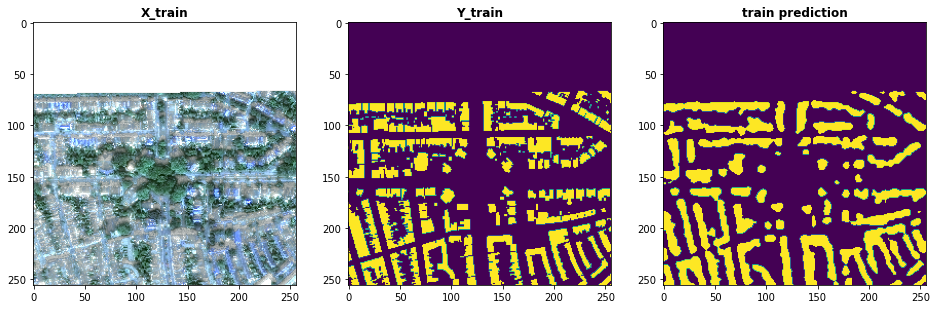

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 32
val preds  set


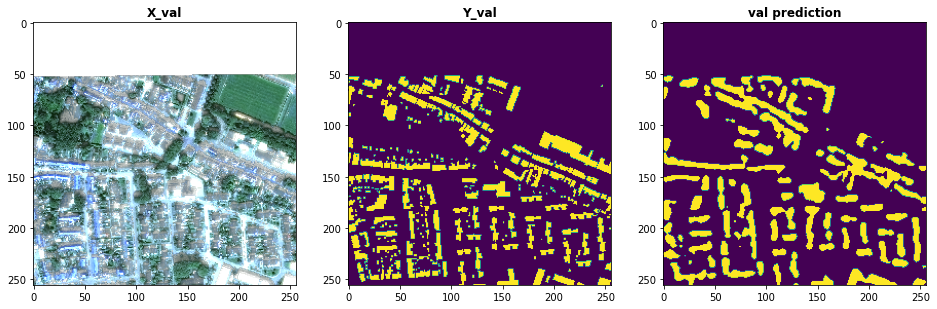

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 38
test preds  set


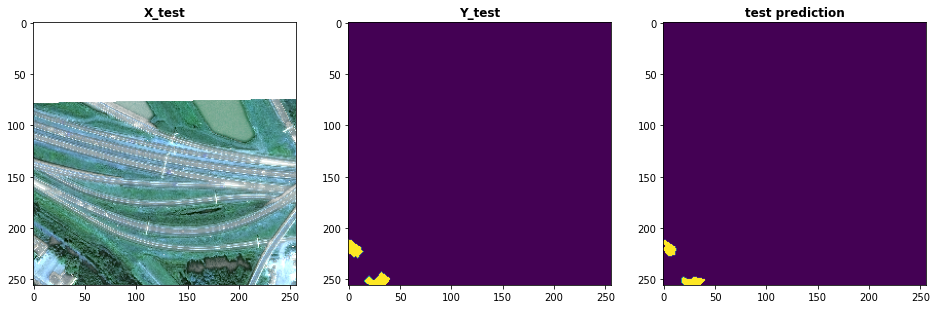

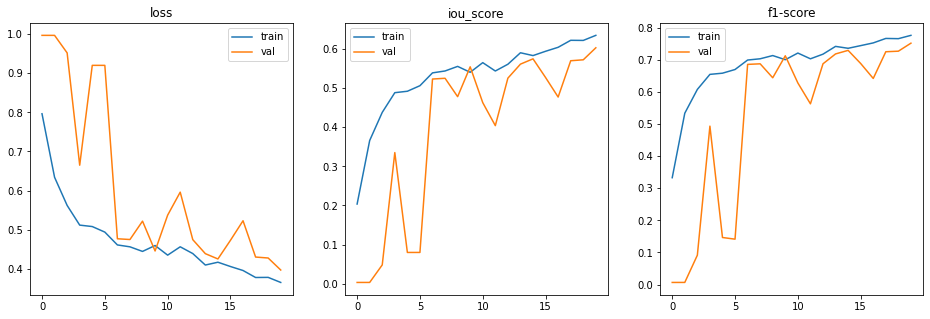

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain resnet34, PS-RGBNIR only, loss: BinaryFocalLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'resnet34'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='resnet34', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 30s 41ms/step - loss: 0.0681 - iou_score: 0.0710 - f1-score: 0.1321 - val_loss: 10.2269 - val_iou_score: 0.0597 - val_f1-score: 0.1114
Epoch 2/20
720/720 [==============================] - 19s 27ms/step - loss: 0.0182 - iou_score: 0.0888 - f1-score: 0.1626 - val_loss: 0.2050 - val_iou_score: 0.0097 - val_f1-score: 0.0193
Epoch 3/20
720/720 [==============================] - 19s 27ms/step - loss: 0.0162 - iou_score: 0.1029 - f1-score: 0.1859 - val_loss: 0.0289 - val_iou_score: 0.0795 - val_f1-score: 0.1458
Epoch 4/20
720/720 [==============================] - 19s 27ms/step - loss: 0.0147 - iou_score: 0.1146 - f1-score: 0.2049 - val_loss: 0.0359 - val_iou_score: 0.0931 - val_f1-score: 0.1685
Epoch 5/20
720/720 [==============================] - 19s 26ms/step - loss: 0.0135 - iou_score: 0.1296 - f1-score: 0.2290 - val_loss: 0.0130 - val_iou_score: 0.1006 - val_f1-score: 0.1810
Epoch 6/20
720

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 7ms/step
train set evaluation
720/720 [==============================] - 5s 7ms/step
loss :  0.012568501238193776
iou_score :  0.22214968502521515
f1-score :  0.3629237413406372

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  72.76017303466797
iou_score :  0.18395046889781952
f1-score :  0.30978506803512573

test set evaluation
80/80 [==============================] - 1s 7ms/step
loss :  0.013359924778342247
iou_score :  0.23378391563892365
f1-score :  0.378538578748703
saved model metrics


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 538
train preds  set


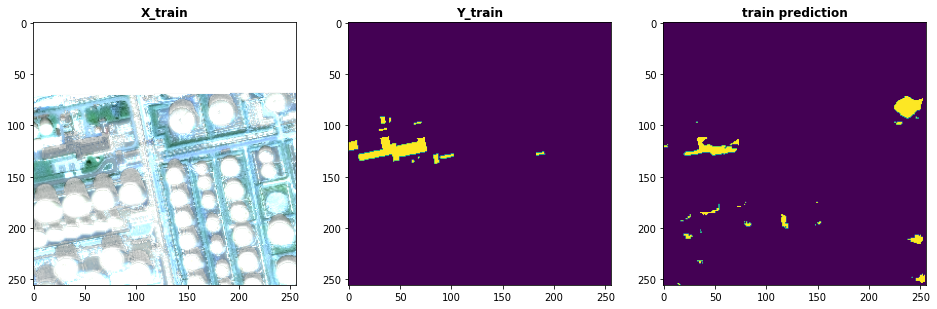

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 28
val preds  set


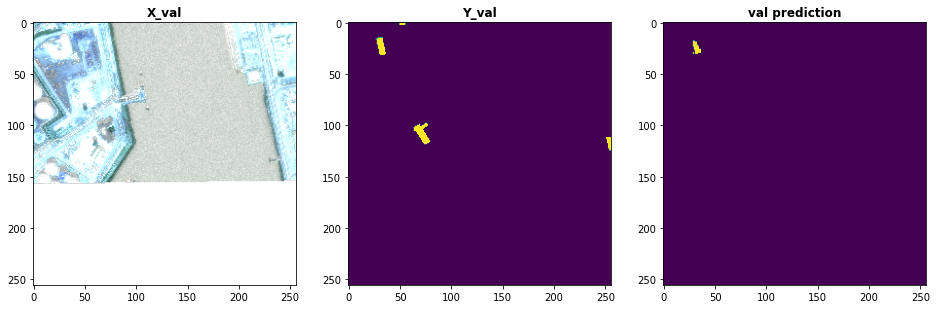

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 67
test preds  set


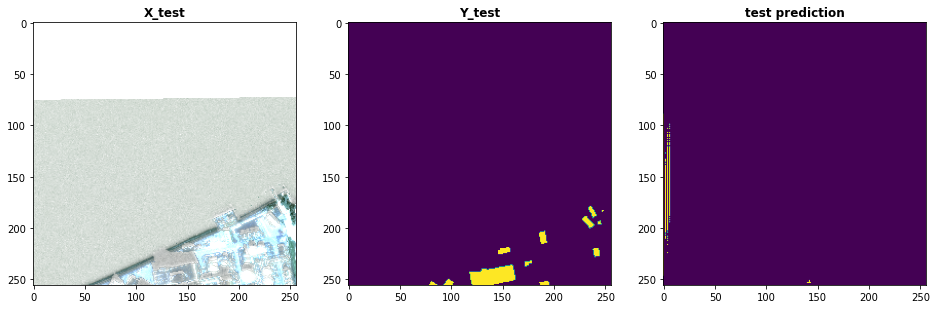

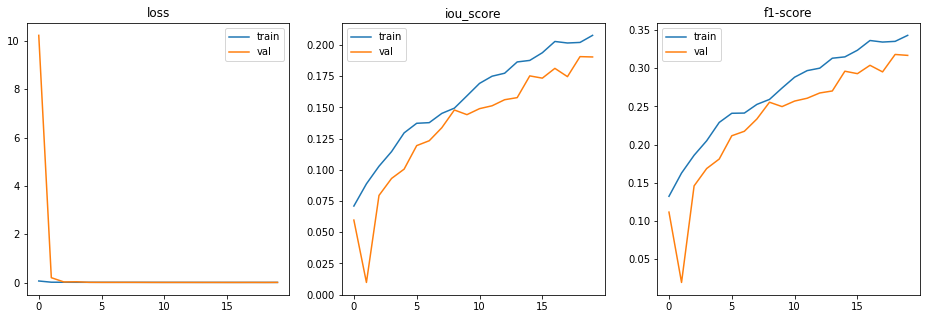

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain vgg16, PS-RGBNIR only, loss: jaccardLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'vgg16'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='vgg16', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 32s 45ms/step - loss: 0.8408 - iou_score: 0.1592 - f1-score: 0.2703 - val_loss: 0.9147 - val_iou_score: 0.0853 - val_f1-score: 0.1561
Epoch 2/20
720/720 [==============================] - 24s 34ms/step - loss: 0.6739 - iou_score: 0.3261 - f1-score: 0.4889 - val_loss: 0.7779 - val_iou_score: 0.2221 - val_f1-score: 0.3620
Epoch 3/20
720/720 [==============================] - 24s 33ms/step - loss: 0.5862 - iou_score: 0.4138 - f1-score: 0.5830 - val_loss: 0.8899 - val_iou_score: 0.1101 - val_f1-score: 0.1978
Epoch 4/20
720/720 [==============================] - 24s 33ms/step - loss: 0.5556 - iou_score: 0.4444 - f1-score: 0.6137 - val_loss: 0.9258 - val_iou_score: 0.0742 - val_f1-score: 0.1380
Epoch 5/20
720/720 [==============================] - 24s 33ms/step - loss: 0.5455 - iou_score: 0.4545 - f1-score: 0.6233 - val_loss: 0.8395 - val_iou_score: 0.1605 - val_f1-score: 0.2756
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 10ms/step
train set evaluation
720/720 [==============================] - 7s 10ms/step
loss :  0.49245478841993545
iou_score :  0.507586658000946
f1-score :  0.6729404330253601

validation set evaluation
80/80 [==============================] - 1s 11ms/step
loss :  0.800279951095581
iou_score :  0.19300365447998047
f1-score :  0.31991901993751526

test set evaluation
80/80 [==============================] - 1s 10ms/step
loss :  0.491417920589447
iou_score :  0.5215508341789246
f1-score :  0.6842000484466553
saved model metrics


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 63
train preds  set


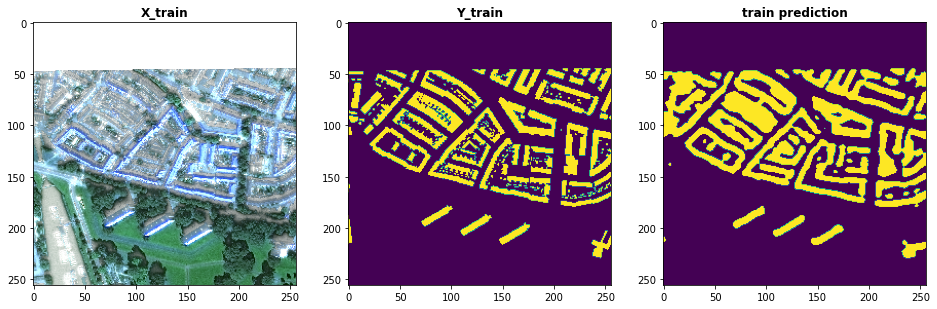

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 23
val preds  set


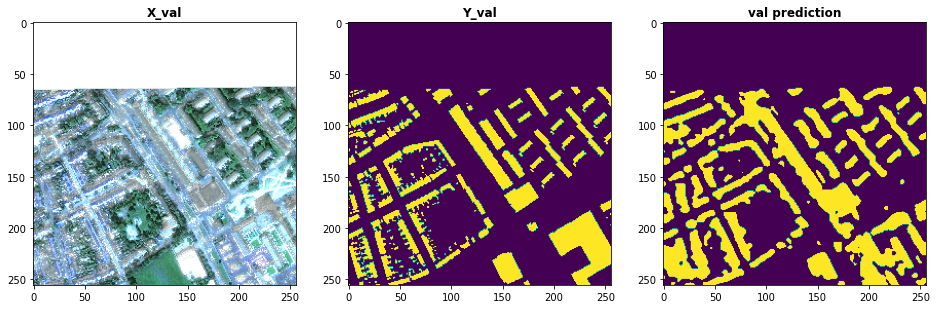

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 17
test preds  set


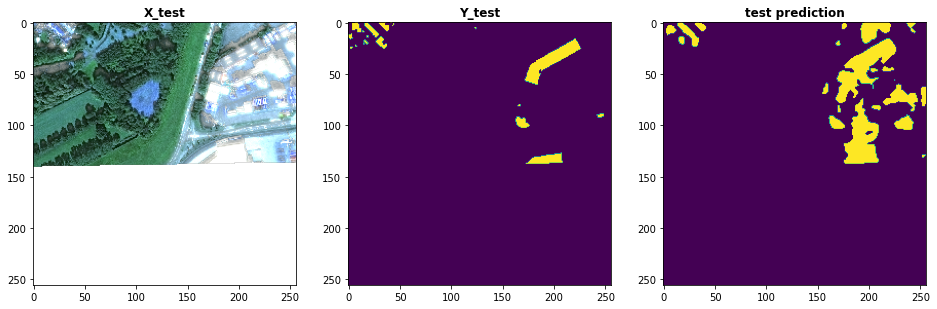

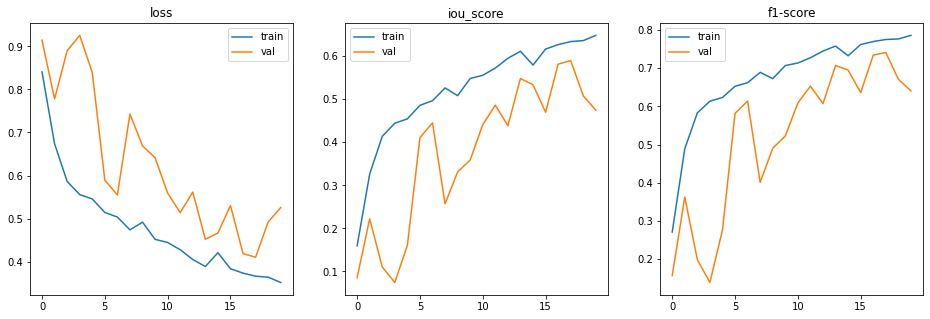

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain vgg16, PS-RGBNIR only, loss: BinaryFocalLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'vgg16'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='vgg16', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 27s 37ms/step - loss: 0.0514 - iou_score: 0.0674 - f1-score: 0.1259 - val_loss: 0.0552 - val_iou_score: 0.0793 - val_f1-score: 0.1452
Epoch 2/20
720/720 [==============================] - 24s 34ms/step - loss: 0.0182 - iou_score: 0.0881 - f1-score: 0.1614 - val_loss: 0.0220 - val_iou_score: 0.0737 - val_f1-score: 0.1361
Epoch 3/20
720/720 [==============================] - 24s 33ms/step - loss: 0.0157 - iou_score: 0.1074 - f1-score: 0.1934 - val_loss: 0.0164 - val_iou_score: 0.0763 - val_f1-score: 0.1409
Epoch 4/20
720/720 [==============================] - 24s 33ms/step - loss: 0.0148 - iou_score: 0.1179 - f1-score: 0.2101 - val_loss: 0.0128 - val_iou_score: 0.0972 - val_f1-score: 0.1758
Epoch 5/20
720/720 [==============================] - 24s 34ms/step - loss: 0.0138 - iou_score: 0.1305 - f1-score: 0.2298 - val_loss: 0.0135 - val_iou_score: 0.1002 - val_f1-score: 0.1805
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 10ms/step
train set evaluation
720/720 [==============================] - 7s 10ms/step
loss :  0.00976764816376898
iou_score :  0.2190677970647812
f1-score :  0.3588830828666687

validation set evaluation
80/80 [==============================] - 1s 11ms/step
loss :  73.9566864013672
iou_score :  0.15057812631130219
f1-score :  0.2611483633518219

test set evaluation
80/80 [==============================] - 1s 10ms/step
loss :  0.010435738787055015
iou_score :  0.22980521619319916
f1-score :  0.3734343349933624
saved model metrics


index: 423
train preds  set


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


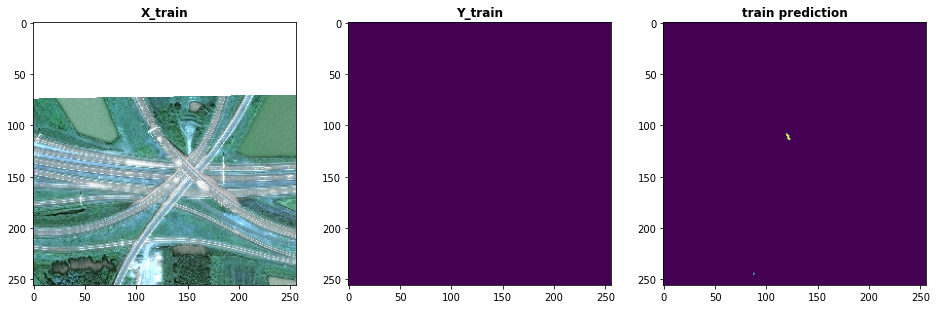

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 61
val preds  set


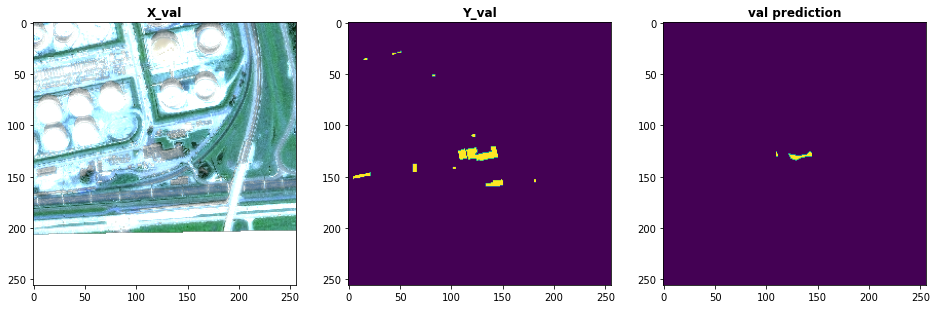

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 21
test preds  set


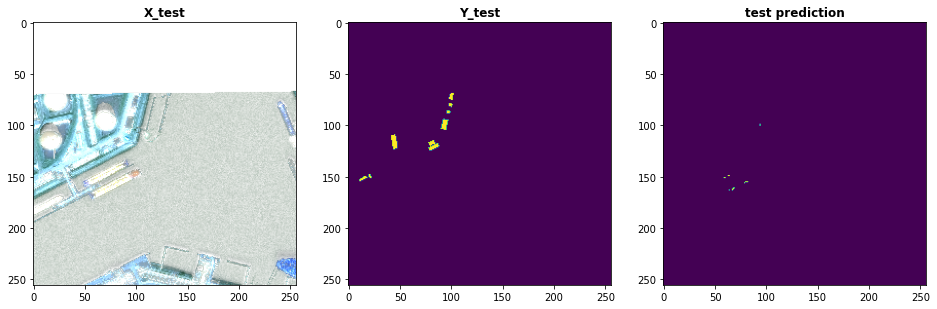

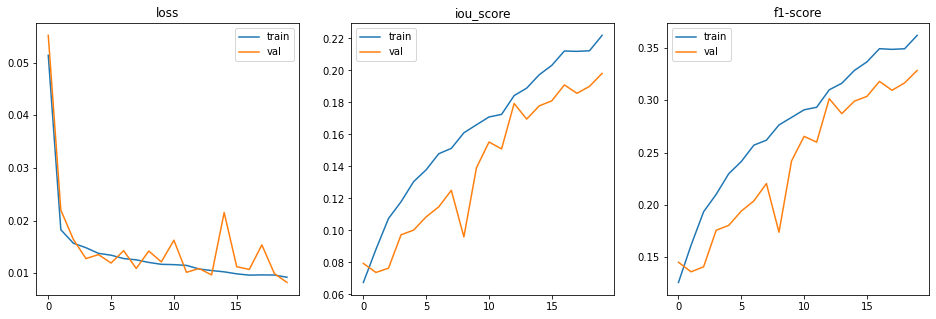

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain efficientnetb4, PS-RGBNIR only, loss: jaccardLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb4'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb4', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 100s 139ms/step - loss: 0.8290 - iou_score: 0.1710 - f1-score: 0.2875 - val_loss: 0.9328 - val_iou_score: 0.0672 - val_f1-score: 0.1247
Epoch 2/20
720/720 [==============================] - 50s 70ms/step - loss: 0.6679 - iou_score: 0.3321 - f1-score: 0.4937 - val_loss: 0.9412 - val_iou_score: 0.0588 - val_f1-score: 0.1100
Epoch 3/20
720/720 [==============================] - 50s 70ms/step - loss: 0.5719 - iou_score: 0.4281 - f1-score: 0.5971 - val_loss: 0.8933 - val_iou_score: 0.1067 - val_f1-score: 0.1918
Epoch 4/20
720/720 [==============================] - 50s 69ms/step - loss: 0.5362 - iou_score: 0.4638 - f1-score: 0.6322 - val_loss: 0.9822 - val_iou_score: 0.0178 - val_f1-score: 0.0349
Epoch 5/20
720/720 [==============================] - 50s 70ms/step - loss: 0.5137 - iou_score: 0.4863 - f1-score: 0.6532 - val_loss: 0.9809 - val_iou_score: 0.0191 - val_f1-score: 0.0372
Epoch 6/20
72

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 14ms/step
train set evaluation
720/720 [==============================] - 10s 14ms/step
loss :  0.3518327580557929
iou_score :  0.649018406867981
f1-score :  0.7869599461555481

validation set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  0.8633255004882813
iou_score :  0.13226646184921265
f1-score :  0.2316925972700119

test set evaluation
80/80 [==============================] - 1s 14ms/step
loss :  0.3771811604499817
iou_score :  0.6271334290504456
f1-score :  0.7704594135284424
saved model metrics


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 70
train preds  set


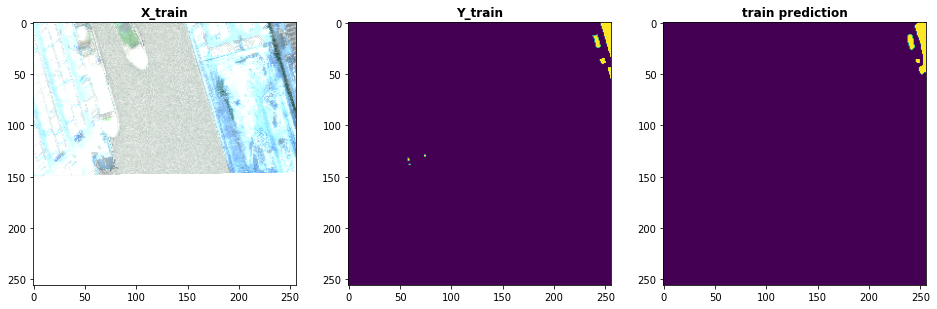

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 28
val preds  set


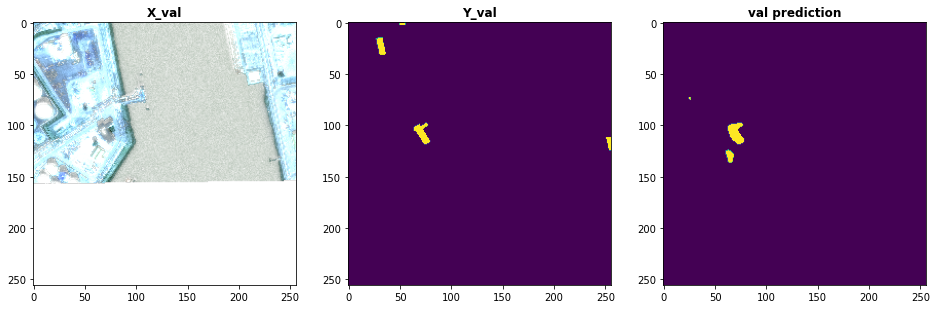

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 76
test preds  set


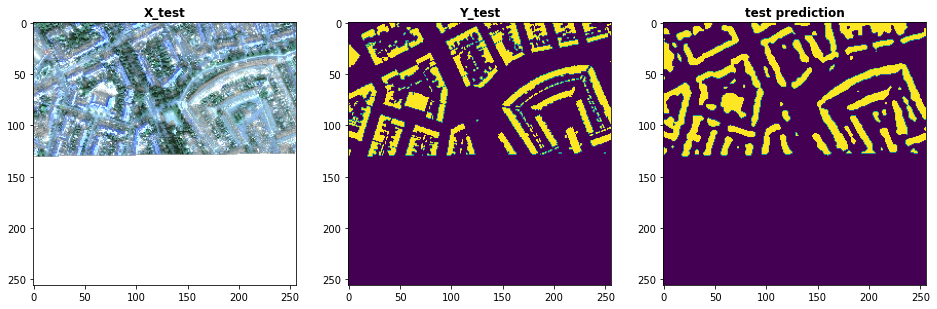

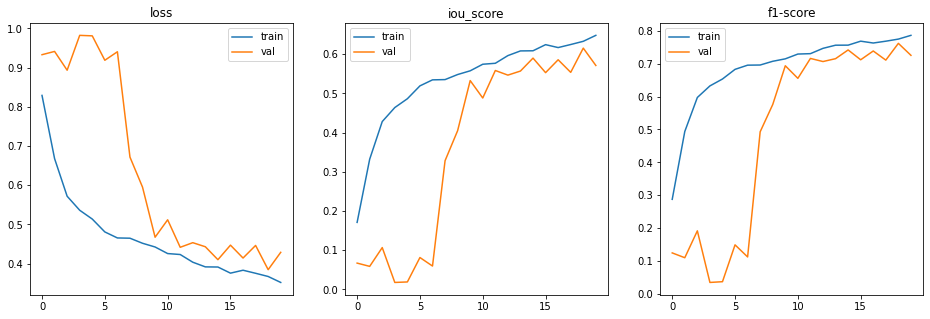

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain efficientnetb4, PS-RGBNIR only, loss: BinaryFocalLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb4'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb4', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 95s 132ms/step - loss: 0.0214 - iou_score: 0.0949 - f1-score: 0.1725 - val_loss: 0.0229 - val_iou_score: 0.0611 - val_f1-score: 0.1144
Epoch 2/20
720/720 [==============================] - 50s 69ms/step - loss: 0.0158 - iou_score: 0.1203 - f1-score: 0.2141 - val_loss: 0.0201 - val_iou_score: 0.0632 - val_f1-score: 0.1181
Epoch 3/20
720/720 [==============================] - 50s 69ms/step - loss: 0.0146 - iou_score: 0.1328 - f1-score: 0.2339 - val_loss: 0.0164 - val_iou_score: 0.0829 - val_f1-score: 0.1521
Epoch 4/20
720/720 [==============================] - 50s 69ms/step - loss: 0.0138 - iou_score: 0.1444 - f1-score: 0.2518 - val_loss: 0.0164 - val_iou_score: 0.1152 - val_f1-score: 0.2047
Epoch 5/20
720/720 [==============================] - 50s 70ms/step - loss: 0.0127 - iou_score: 0.1562 - f1-score: 0.2695 - val_loss: 0.0115 - val_iou_score: 0.1304 - val_f1-score: 0.2287
Epoch 6/20
720

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 14ms/step
train set evaluation
720/720 [==============================] - 10s 14ms/step
loss :  0.007807898335158825
iou_score :  0.26323020458221436
f1-score :  0.41626444458961487

validation set evaluation
80/80 [==============================] - 1s 15ms/step
loss :  72.61280212402343
iou_score :  0.16812224686145782
f1-score :  0.2871069610118866

test set evaluation
80/80 [==============================] - 1s 14ms/step
loss :  0.009385023638606072
iou_score :  0.26459282636642456
f1-score :  0.41807636618614197
saved model metrics


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 171
train preds  set


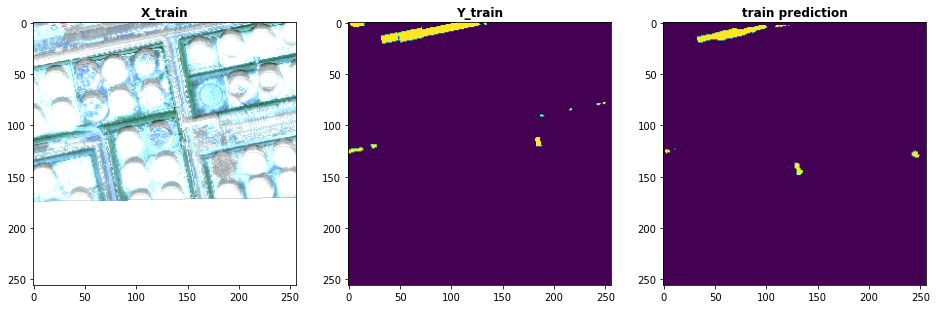

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 8
val preds  set


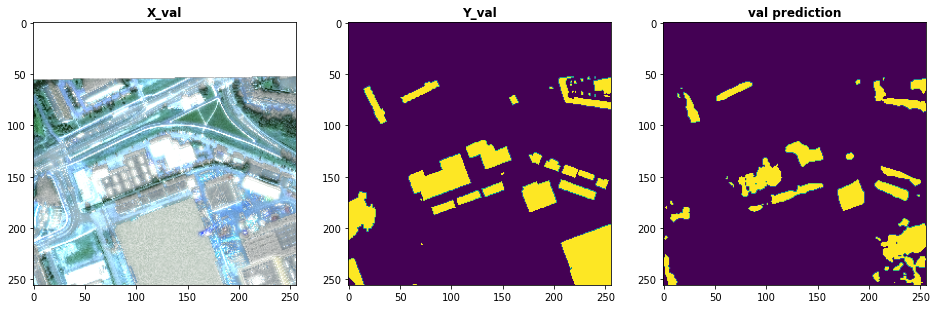

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 23
test preds  set


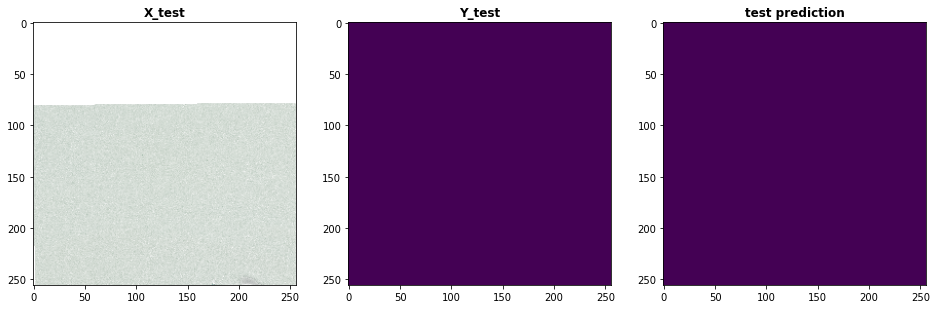

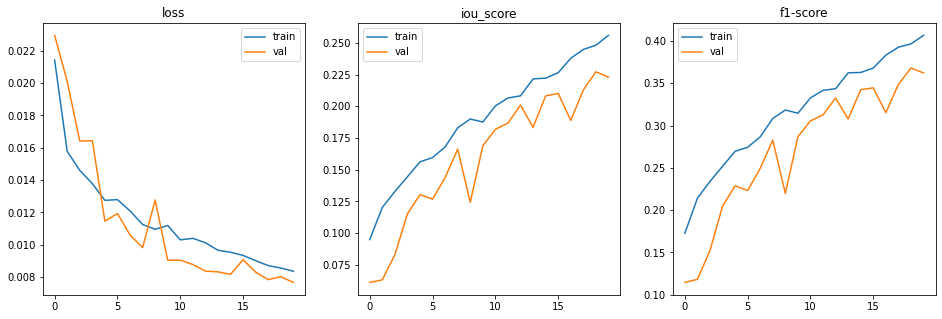

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain efficientnetb0, PS-RGBNIR only, loss: jaccardLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 48s 66ms/step - loss: 0.8278 - iou_score: 0.1722 - f1-score: 0.2882 - val_loss: 0.9433 - val_iou_score: 0.0567 - val_f1-score: 0.1067
Epoch 2/20
720/720 [==============================] - 26s 36ms/step - loss: 0.6536 - iou_score: 0.3464 - f1-score: 0.5117 - val_loss: 0.9787 - val_iou_score: 0.0213 - val_f1-score: 0.0417
Epoch 3/20
720/720 [==============================] - 26s 36ms/step - loss: 0.5765 - iou_score: 0.4235 - f1-score: 0.5928 - val_loss: 0.9949 - val_iou_score: 0.0051 - val_f1-score: 0.0102
Epoch 4/20
720/720 [==============================] - 26s 36ms/step - loss: 0.5274 - iou_score: 0.4726 - f1-score: 0.6407 - val_loss: 0.9929 - val_iou_score: 0.0071 - val_f1-score: 0.0140
Epoch 5/20
720/720 [==============================] - 26s 36ms/step - loss: 0.5042 - iou_score: 0.4958 - f1-score: 0.6613 - val_loss: 0.9977 - val_iou_score: 0.0023 - val_f1-score: 0.0046
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 6s 8ms/step
loss :  0.35999975601832074
iou_score :  0.6408141851425171
f1-score :  0.7809119820594788

validation set evaluation
80/80 [==============================] - 1s 9ms/step
loss :  0.8964185357093811
iou_score :  0.10030817985534668
f1-score :  0.18095259368419647

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.39491318464279174
iou_score :  0.6096531748771667
f1-score :  0.7571969032287598
saved model metrics


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 202
train preds  set


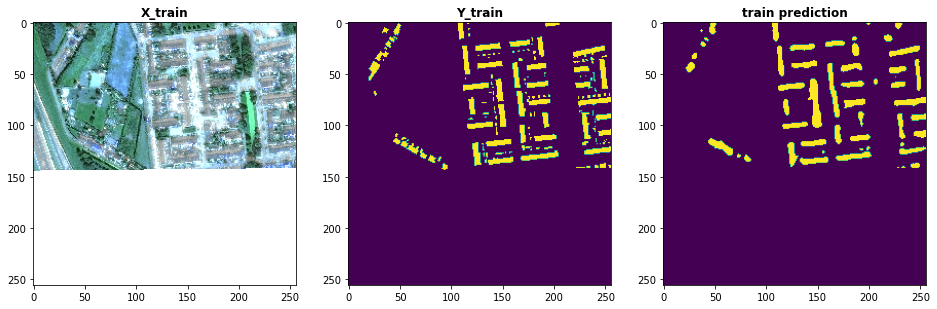

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 28
val preds  set


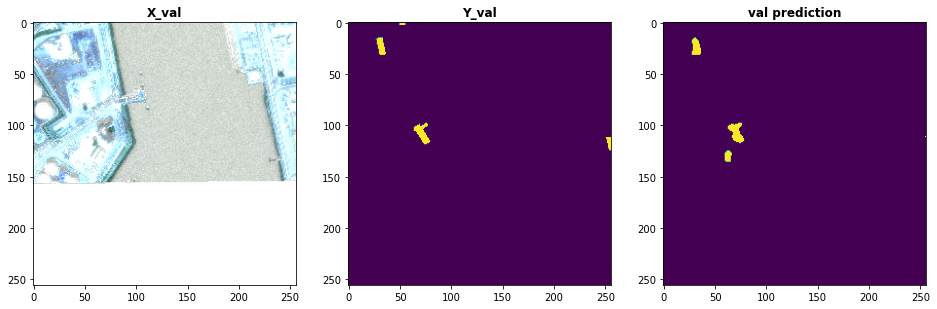

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 53
test preds  set


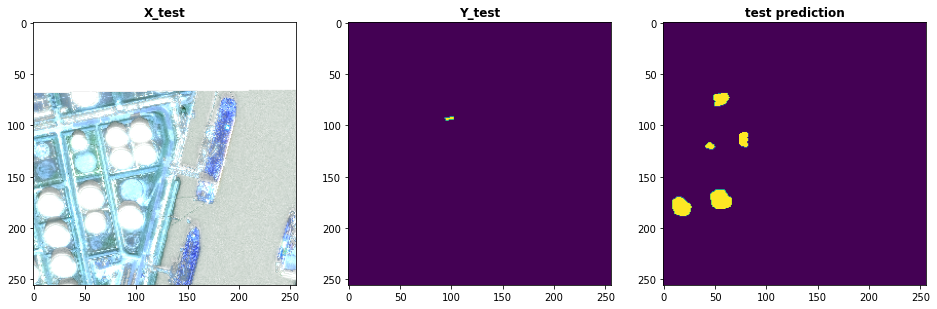

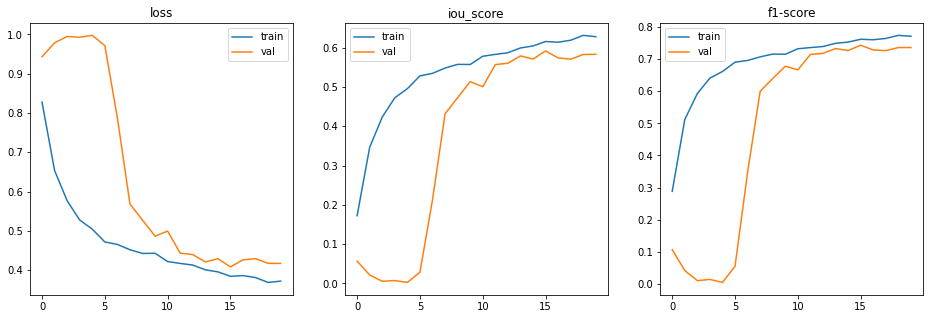

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain efficientnetb0, PS-RGBNIR only, loss: BinaryFocalLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'efficientnetb0'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='efficientnetb0', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 47s 65ms/step - loss: 0.0412 - iou_score: 0.0728 - f1-score: 0.1353 - val_loss: 0.0486 - val_iou_score: 0.0587 - val_f1-score: 0.1098
Epoch 2/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0180 - iou_score: 0.0916 - f1-score: 0.1673 - val_loss: 0.0288 - val_iou_score: 0.0490 - val_f1-score: 0.0928
Epoch 3/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0160 - iou_score: 0.1080 - f1-score: 0.1941 - val_loss: 0.0248 - val_iou_score: 0.0458 - val_f1-score: 0.0872
Epoch 4/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0148 - iou_score: 0.1223 - f1-score: 0.2172 - val_loss: 0.0229 - val_iou_score: 0.0514 - val_f1-score: 0.0973
Epoch 5/20
720/720 [==============================] - 26s 36ms/step - loss: 0.0135 - iou_score: 0.1370 - f1-score: 0.2405 - val_loss: 0.0192 - val_iou_score: 0.0649 - val_f1-score: 0.1213
Epoch 6/20
720/

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 8ms/step
train set evaluation
720/720 [==============================] - 6s 8ms/step
loss :  0.008095038164820935
iou_score :  0.24916908144950867
f1-score :  0.3984392285346985

validation set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  72.25538024902343
iou_score :  0.16603876650333405
f1-score :  0.28390440344810486

test set evaluation
80/80 [==============================] - 1s 8ms/step
loss :  0.009746118262410165
iou_score :  0.25066787004470825
f1-score :  0.40041467547416687
saved model metrics


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 23
train preds  set


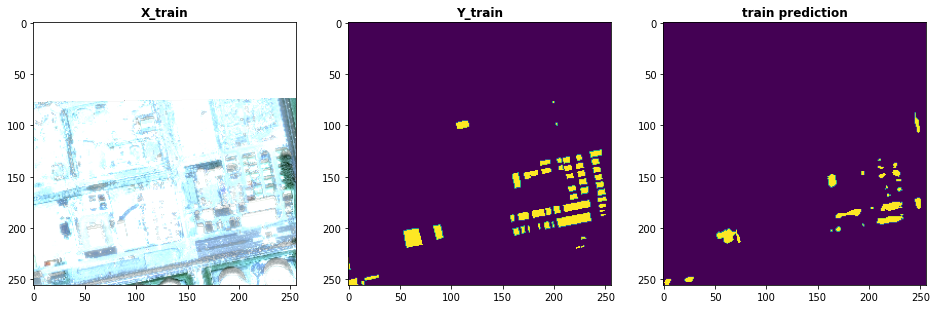

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 4
val preds  set


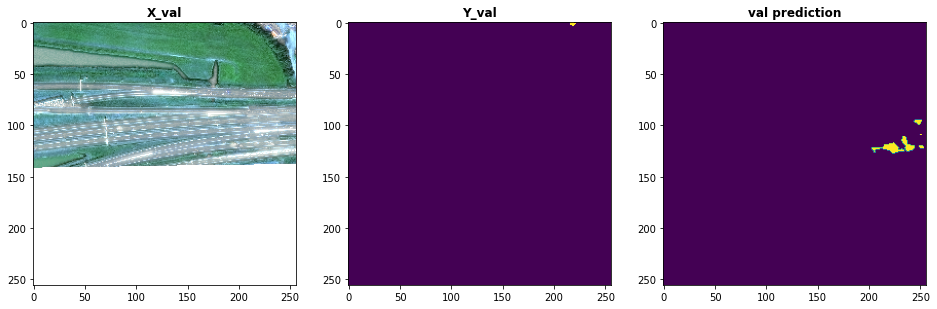

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 69
test preds  set


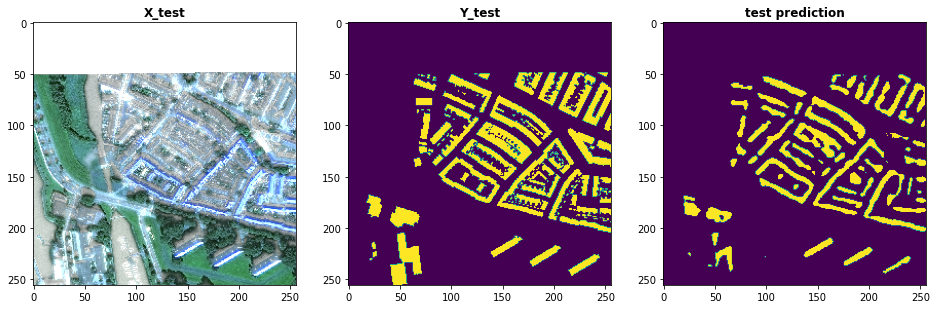

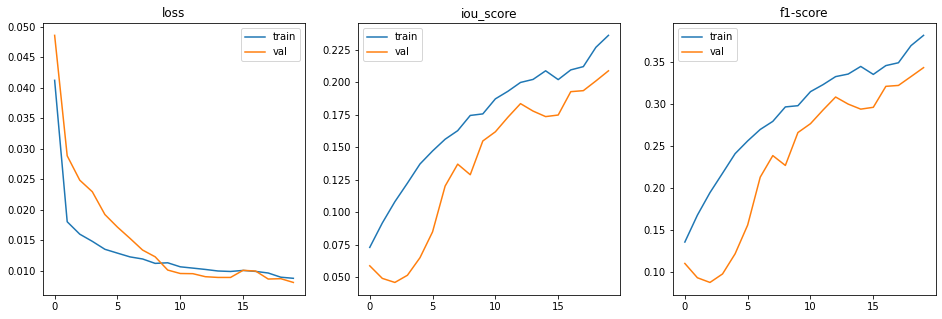

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain densenet201, PS-RGBNIR only, loss: jaccardLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = JaccardLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'densenet201'
MODEL_LOSS_FUNCTION = 'JaccardLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='densenet201', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 141s 197ms/step - loss: 0.8115 - iou_score: 0.1885 - f1-score: 0.3131 - val_loss: 0.9936 - val_iou_score: 0.0064 - val_f1-score: 0.0127
Epoch 2/20
720/720 [==============================] - 50s 70ms/step - loss: 0.6421 - iou_score: 0.3579 - f1-score: 0.5240 - val_loss: 0.9841 - val_iou_score: 0.0159 - val_f1-score: 0.0313
Epoch 3/20
720/720 [==============================] - 50s 70ms/step - loss: 0.5549 - iou_score: 0.4451 - f1-score: 0.6133 - val_loss: 0.9369 - val_iou_score: 0.0631 - val_f1-score: 0.1173
Epoch 4/20
720/720 [==============================] - 50s 70ms/step - loss: 0.5456 - iou_score: 0.4544 - f1-score: 0.6230 - val_loss: 0.9179 - val_iou_score: 0.0821 - val_f1-score: 0.1460
Epoch 5/20
720/720 [==============================] - 50s 70ms/step - loss: 0.5105 - iou_score: 0.4895 - f1-score: 0.6554 - val_loss: 0.9215 - val_iou_score: 0.0785 - val_f1-score: 0.1417
Epoch 6/20
72

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 17ms/step
train set evaluation
720/720 [==============================] - 12s 16ms/step
loss :  0.37981464597913955
iou_score :  0.6207706332206726
f1-score :  0.7658095359802246

validation set evaluation
80/80 [==============================] - 1s 18ms/step
loss :  0.8797536969184876
iou_score :  0.11640810966491699
f1-score :  0.20726768672466278

test set evaluation
80/80 [==============================] - 1s 16ms/step
loss :  0.3989596366882324
iou_score :  0.6065341234207153
f1-score :  0.7545881271362305
saved model metrics


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 92
train preds  set


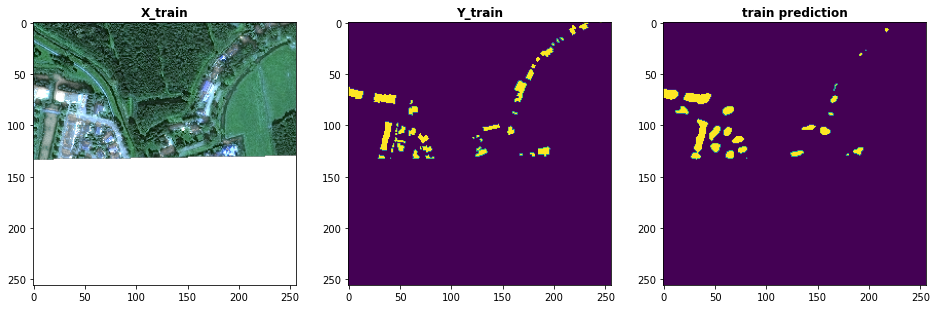

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 40
val preds  set


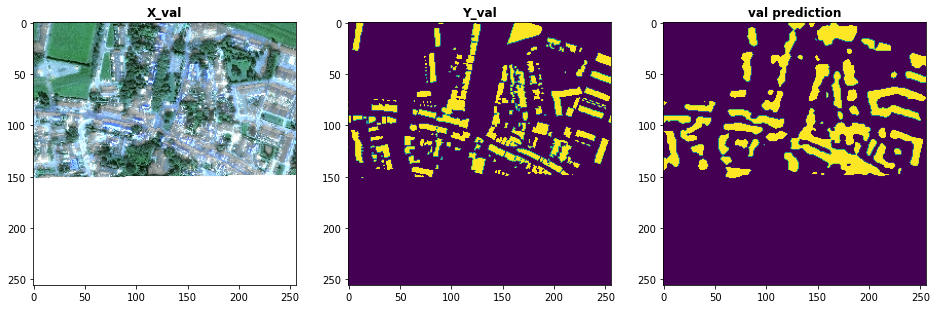

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 9
test preds  set


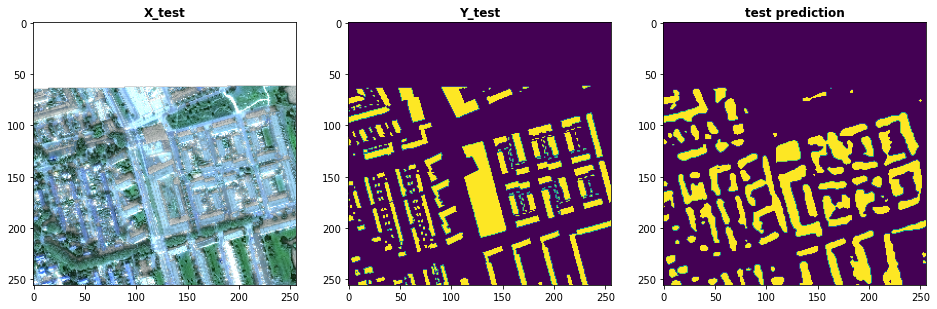

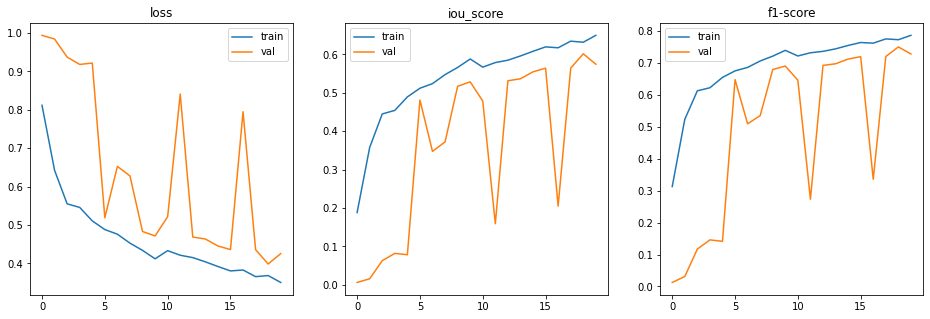

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

### pretrain densenet201, PS-RGBNIR only, loss: BinaryFocalLoss


In [ ]:
MODEL_OPTIMIZER = 'adam'
MODEL_LOSS = BinaryFocalLoss()
MODEL_METRICS =[IOUScore(), FScore()]
MODEL_VAL_SPLIT = 0.1
MODEL_VAL_OFFSET = int(SIZE_TRAIN*(1-MODEL_VAL_SPLIT))
MODEL_BATCH_SIZE = 16
MODEL_EPOCHS = 20

MODEL_TYPE = 'segmentation-models Unet'
MODEL_PRETRAIN = 'densenet201'
MODEL_LOSS_FUNCTION = 'BinaryFocalLoss'

MODEL_NAME = 'MODEL_{}__PRETRAIN_{}__LOSS_{}__SHAPE_{}_{}x{}__EPOCH_{}__TRAIN_{}__TEST_{}'.format(MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, MODEL_EPOCHS, SIZE_TRAIN, SIZE_TEST)

In [ ]:
model = Unet(backbone_name='densenet201', encoder_weights=None, input_shape=(None, None, 4))

model.compile(
    optimizer=MODEL_OPTIMIZER,
    loss=MODEL_LOSS,
    metrics=MODEL_METRICS,
)

checkpointer = tf.keras.callbacks.ModelCheckpoint( (MODEL_NAME + '.h5'), verbose=1, save_best_only=True)

callbacks = [
        tf.keras.callbacks.EarlyStopping(patience=2, monitor='val_loss'),
        tf.keras.callbacks.TensorBoard(log_dir='logs')
      ]   

results = model.fit(X_train, Y_train, batch_size=MODEL_BATCH_SIZE, epochs=MODEL_EPOCHS, validation_split=MODEL_VAL_SPLIT)

/usr/local/lib/python3.6/dist-packages/keras_applications/imagenet_utils.py:279: UserWarning: This model usually expects 1 or 3 input channels. However, it was passed an input_shape with 4 input channels.
  str(input_shape[-1]) + ' input channels.')


Train on 720 samples, validate on 80 samples
Epoch 1/20
720/720 [==============================] - 148s 205ms/step - loss: 0.0418 - iou_score: 0.0784 - f1-score: 0.1450 - val_loss: 0.2583 - val_iou_score: 0.0029 - val_f1-score: 0.0057
Epoch 2/20
720/720 [==============================] - 50s 70ms/step - loss: 0.0162 - iou_score: 0.1033 - f1-score: 0.1866 - val_loss: 0.0275 - val_iou_score: 0.0536 - val_f1-score: 0.1010
Epoch 3/20
720/720 [==============================] - 50s 70ms/step - loss: 0.0148 - iou_score: 0.1197 - f1-score: 0.2133 - val_loss: 0.0182 - val_iou_score: 0.0810 - val_f1-score: 0.1486
Epoch 4/20
720/720 [==============================] - 50s 70ms/step - loss: 0.0141 - iou_score: 0.1303 - f1-score: 0.2299 - val_loss: 0.0138 - val_iou_score: 0.1084 - val_f1-score: 0.1940
Epoch 5/20
720/720 [==============================] - 50s 70ms/step - loss: 0.0130 - iou_score: 0.1407 - f1-score: 0.2460 - val_loss: 0.0151 - val_iou_score: 0.1129 - val_f1-score: 0.2015
Epoch 6/20
72

In [ ]:
preds_train_t, preds_val_t, preds_test_t = gen_predictions(model, X_train, Y_train, X_test, Y_test, MODEL_VAL_OFFSET, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, PATH_METRICS)

80/80 [==============================] - 1s 19ms/step
train set evaluation
720/720 [==============================] - 12s 16ms/step
loss :  0.008613674611681037
iou_score :  0.2467036098241806
f1-score :  0.3951975405216217

validation set evaluation
80/80 [==============================] - 1s 18ms/step
loss :  64.9833267211914
iou_score :  0.19426900148391724
f1-score :  0.3242781460285187

test set evaluation
80/80 [==============================] - 1s 17ms/step
loss :  0.009735936112701894
iou_score :  0.2533054053783417
f1-score :  0.40363001823425293
saved model metrics


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 191
train preds  set


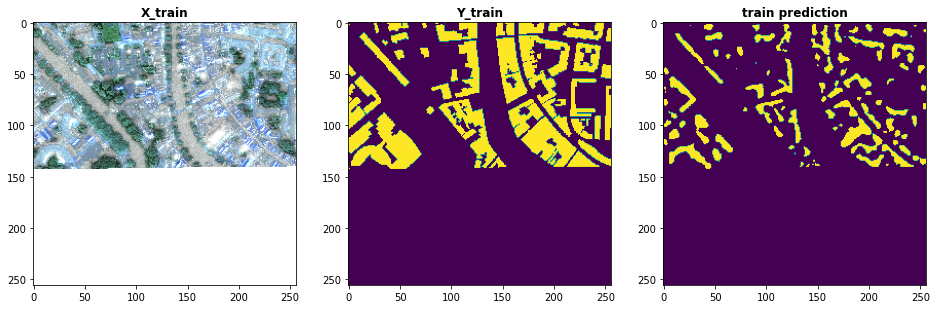

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 25
val preds  set


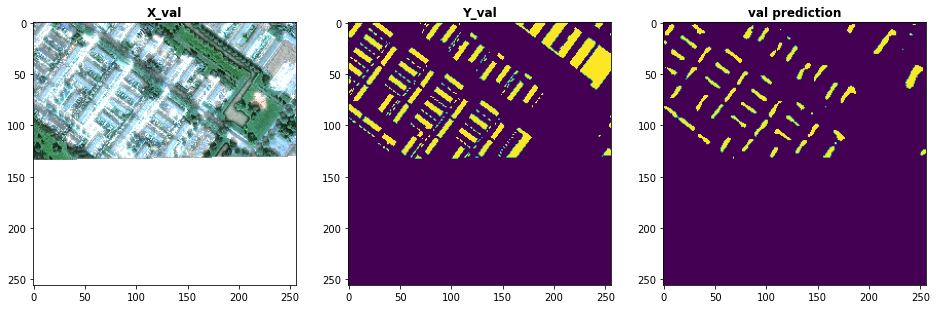

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


index: 70
test preds  set


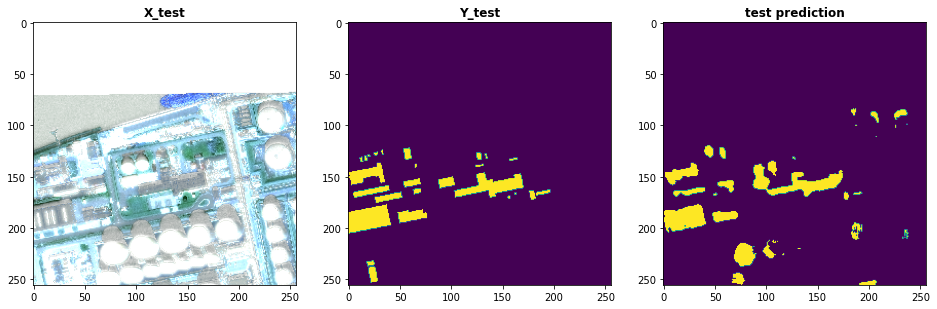

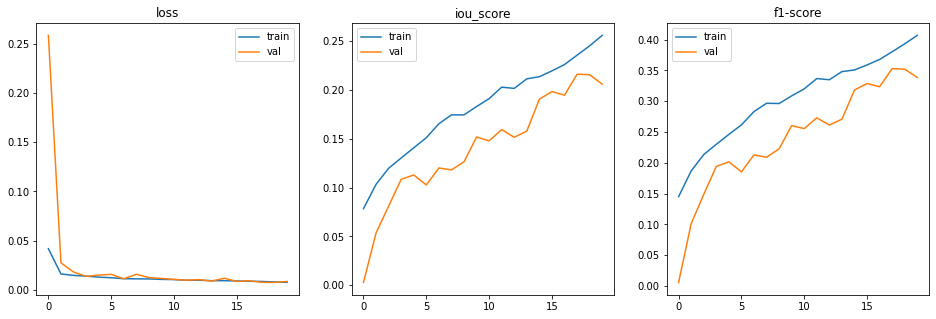

In [ ]:
plot_XY_preds('train preds', X_train[:MODEL_VAL_OFFSET], Y_train[:MODEL_VAL_OFFSET], preds_train_t, 'X_train', 'Y_train', 'train prediction')
plot_XY_preds('val preds', X_train[MODEL_VAL_OFFSET:], Y_train[MODEL_VAL_OFFSET:], preds_val_t, 'X_val', 'Y_val', 'val prediction')
plot_XY_preds('test preds', X_test, Y_test, preds_test_t, 'X_test', 'Y_test', 'test prediction')
plot_history(results.history)

# TRIAL

## Bring in the trial data
Just to try and open stuff up and see

In [ ]:
PATH_DATA = Path(root_dir + '/spacenet6/spacenet6_data_trial')

PATH_0 = PATH_DATA/'orientation_0'
PATH_0_MASK = PATH_0/'mask'
PATH_0_PSRGB = PATH_0/'psrgb'
PATH_0_SAR = PATH_0/'sar'

PATH_1 = PATH_DATA/'orientation_1'
PATH_1_MASK = PATH_1/'mask'
PATH_1_PSRGB = PATH_1/'psrgb'
PATH_1_SAR = PATH_1/'sar'

In [ ]:
def open_files(data_path, channels, dtype):
  ids = next(os.walk(data_path))[2]
  ids.sort()

  raster = np.zeros((len(ids),channels,900,900))

  for n, id in tqdm(enumerate(ids), total=len(ids), position=0, leave=True):
    file = rasterio.open(data_path/id).read()
    raster[n] = file

    if channels == 4:
      file = np.delete(file, 2, 0) 

  return raster.astype(dtype)

In [ ]:
def plot_psrgb_mask_sar(plotname, psrgb, mask, sar):
  ix = np.random.randint(0, len(psrgb))
  print("index: {}".format(ix))
  print(plotname, " set")

  fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(12,6))
  show(psrgb[ix], ax=ax1, title='psrgb')
  show(mask[ix], ax=ax2, title='mask')
  show(sar[ix], ax=ax3, title='sar', cmap='ocean')
  plt.show()

In [ ]:
_0_mask = open_files(PATH_0_MASK, 1, np.bool)
_0_psrgb = open_files(PATH_0_PSRGB, 3, np.uint8)
_0_sar = open_files(PATH_0_SAR, 4, np.uint8)

_1_mask = open_files(PATH_1_MASK, 1, np.bool)
_1_psrgb = open_files(PATH_1_PSRGB, 3, np.uint8)
_1_sar = open_files(PATH_1_SAR, 4, np.uint8)

100%|██████████| 9/9 [00:00<00:00, 15.37it/s]


In [ ]:
# _0_psrgb[0].dtype
# a = rasterio.open(PATH_0_MASK/_0_mask_ids[0]).read()
# a.shape

index: 1
orientation 0  set


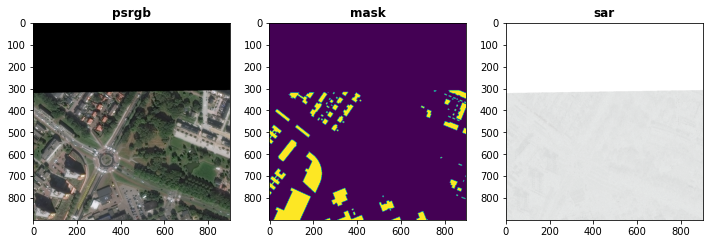

index: 2
orientation 1  set


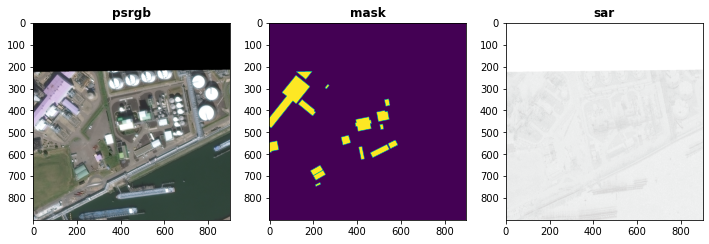

In [ ]:
plot_psrgb_mask_sar('orientation 0', _0_psrgb, _0_mask, _0_sar)
plot_psrgb_mask_sar('orientation 1', _1_psrgb, _1_mask, _1_sar)

In [ ]:
b = copy.deepcopy(a)
b = np.delete(b, 2, 0) # delete the VH channel
b.shape

(3, 900, 900)

In [ ]:
a = np.zeros((9,3,900,900))
for n, img in tqdm(enumerate(_1_sar), total=len(_1_sar), leave=True, position=0):
  a[n] = np.delete(img, 2, 0)
# a = copy.deepcopy(_1_sar[0])
# a = np.delete(a, 2, 0)
# a.shape


100%|██████████| 9/9 [00:00<00:00, 238.42it/s]


array([[[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0., ..., 20., 15., 18.],
        [ 0.,  0.,  0., ..., 17., 18., 22.],
        [ 0.,  0.,  0., ..., 19., 23., 24.]],

       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0., ..., 36., 35., 40.],
        [ 0.,  0.,  0., ..., 38., 36., 35.],
        [ 0.,  0.,  0., ..., 39., 42., 37.]],

       [[ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        [ 0.,  0.,  0., ...,  0.,  0.,  0.],
        ...,
        [ 0.,  0.,  0., ..., 17., 17., 21.],
        [ 0.,  0.,  0., ..., 17., 17., 18.],
        [ 0.,  0.,  0., ..., 21., 21., 22.]]])

Conventionally, 4 channel SAR data represents the channels HH-HV-VH-VV. Let's just test if we can do any transfer learning from three channels alone, HH-HV-VV (drop the third channel)

In [ ]:
for n, sar in tqdm(enumerate(_0_sar), total=len(_0_sar), position=0, leave=True):
  sar = 

## Try and train on sar data with 3 channels


In [ ]:
X_train_sar_3_channel = copy.deepcopy(X_train_sar)
X_test_sar_3_channel = copy.deepcopy(X_test_sar)

print(X_train_sar_3_channel.shape, X_test_sar_3_channel.shape)

(800, 256, 256, 4) (80, 256, 256, 4)


In [ ]:
X_train = np.zeros((SIZE_TRAIN,IMG_HEIGHT,IMG_WIDTH,3), dtype=np.uint8)
Y_train = Y_train_sar
X_test = np.zeros((SIZE_TEST,IMG_HEIGHT,IMG_WIDTH,3), dtype=np.uint8)
Y_test = Y_test_sar

Removing the third channel

In [ ]:
for n, img in tqdm(enumerate(X_train_sar_3_channel), total=SIZE_TRAIN, position=0, leave=True):
  img = reshape_as_raster(img)
  img = np.delete(img, 2, 0)
  X_train[n] = reshape_as_image(img)

for n, img in tqdm(enumerate(X_test_sar_3_channel), total=SIZE_TEST, position=0, leave=True):
  img = reshape_as_raster(img)
  img = np.delete(img, 2, 0)
  X_test[n] = reshape_as_image(img)



100%|██████████| 80/80 [00:00<00:00, 2046.29it/s]


Verify the image conversion, and inspect the data

(800, 256, 256, 3) (80, 256, 256, 3)
index: 107
train  set


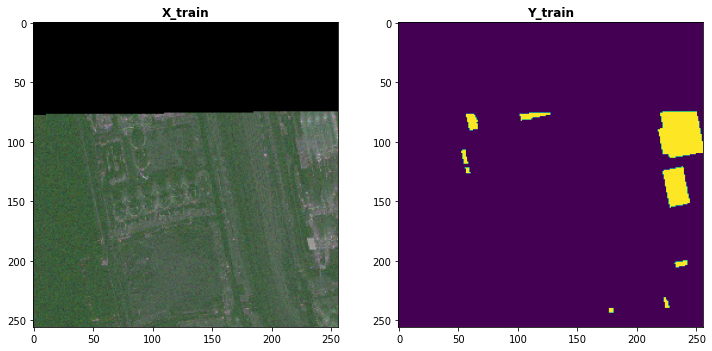

index: 65
test  set


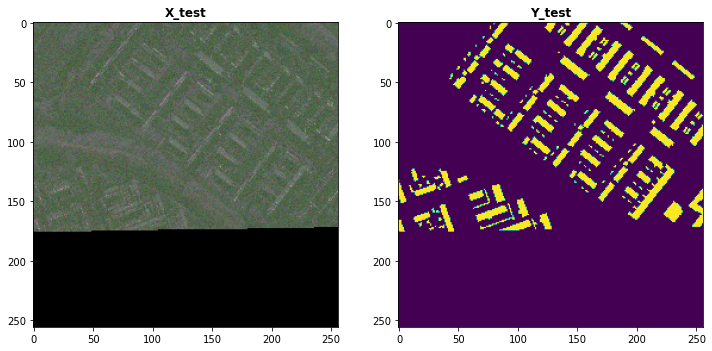

In [ ]:
print(X_train.shape, X_test.shape)
plot_XY('train', X_train, Y_train, 'X_train', 'Y_train')
plot_XY('test', X_test, Y_test, 'X_test', 'Y_test')

## Save output to csv

In [ ]:
MODEL_TYPE = 'satellite_unet'
MODEL_PRETRAIN = None
LOSS_FUNCTION = 'Jaccard'


In [ ]:
import datetime
TIMESTAMP = datetime.datetime.now().strftime("%m/%d/%Y %H:%M:%S")

In [ ]:
MODEL_TYPE = 'satellite_unet'
MODEL_PRETRAIN = None
LOSS_FUNCTION = 'Jaccard'
TIMESTAMP = datetime.datetime.now().strftime("%m/%d/%Y %H:%M:%S")

model_metrics = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, 1, 2, 3, 1, 2, 3, 1, 2, 3], [TIMESTAMP, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, 1, 2, 3, 1, 2, 3, 1, 2, 3], [TIMESTAMP, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, 1, 2, 3, 1, 2, 3, 1, 2, 3]]),
                   columns=['timestamp', 'img_type', 'model_type', 'pretrain', 'loss_function', 'size_train', 'size_test', 'train_loss', 'train_iou_score', 'train_f1-score', 'val_loss', 'val_iou_score', 'val_f1-score', 'test_loss', 'test_iou_score', 'test_f1-score', ],
                  )
model_metrics

,timestamp,img_type,model_type,pretrain,loss_function,size_train,size_test,train_loss,train_iou_score,train_f1-score,val_loss,val_iou_score,val_f1-score,test_loss,test_iou_score,test_f1-score
0,07/03/2020 08:34:51,SAR-Intensity,satellite_unet,None,Jaccard,800,80,1,2,3,1,2,3,1,2,3
1,07/03/2020 08:34:51,SAR-Intensity,satellite_unet,None,Jaccard,800,80,1,2,3,1,2,3,1,2,3
2,07/03/2020 08:34:51,SAR-Intensity,satellite_unet,None,Jaccard,800,80,1,2,3,1,2,3,1,2,3


In [ ]:
PATH_METRICS = '/content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/metrics.csv'

In [ ]:
model_metrics = pd.DataFrame(np.array([ [None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None], 
                                      #   [None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None],
                                      #  [None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None],
                                      ]),
                   columns=['timestamp', 'img_type', 'model_type', 'pretrain', 'loss_function', 'size_train', 'size_test', 'train_loss', 'train_iou_score', 'train_f1-score', 'val_loss', 'val_iou_score', 'val_f1-score', 'test_loss', 'test_iou_score', 'test_f1-score'],
                  )
model_metrics

,timestamp,img_type,model_type,pretrain,loss_function,size_train,size_test,train_loss,train_iou_score,train_f1-score,val_loss,val_iou_score,val_f1-score,test_loss,test_iou_score,test_f1-score
0,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None,None


In [ ]:
model_metrics.to_csv(PATH_METRICS, index=False)

In [ ]:
all_metrics = pd.read_csv(PATH_METRICS)
all_metrics

,timestamp,img_type,model_type,pretrain,loss_function,size_train,size_test,train_loss,train_iou_score,train_f1-score,val_loss,val_iou_score,val_f1-score,test_loss,test_iou_score,test_f1-score
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
MODEL_TYPE = 'trial'
MODEL_PRETRAIN = 'trial'
MODEL_LOSS_FUNCTION = 'trial'
TIMESTAMP = datetime.datetime.now().strftime("%m/%d/%Y %H:%M:%S")


a = pd.DataFrame([pd.Series([TIMESTAMP, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, 0, 0, 0, 0, 0, 0, 0, 0, 0])])
                                      #   [None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None],
                                      #  [None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None],
a

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,07/03/2020 09:11:55,SAR-Intensity,trial,trial,trial,800,80,0,0,0,0,0,0,0,0,0


In [ ]:
all_metrics = pd.concat([a, all_metrics])
all_metrics

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,img_type,loss_function,model_type,pretrain,size_test,size_train,test_f1-score,test_iou_score,test_loss,timestamp,train_f1-score,train_iou_score,train_loss,val_f1-score,val_iou_score,val_loss
0,07/03/2020 09:11:55,SAR-Intensity,trial,trial,trial,800.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
all_metrics.to_csv(PATH_METRICS, index=False)

In [ ]:
b = pd.read_csv(PATH_METRICS)
b

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,img_type,loss_function,model_type,pretrain,size_test,size_train,test_f1-score,test_iou_score,test_loss,timestamp,train_f1-score,train_iou_score,train_loss,val_f1-score,val_iou_score,val_loss
0,07/03/2020 09:11:55,SAR-Intensity,trial,trial,trial,800.0,80.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
a = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, 0, 0, 0, 0, 0, 0, 0, 0, 0],
                                      #   [None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None],
                                      #  [None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None],
                                      ]),
                   columns=['timestamp', 'img_type', 'model_type', 'pretrain', 'loss_function', 'size_train', 'size_test', 'train_loss', 'train_iou_score', 'train_f1-score', 'val_loss', 'val_iou_score', 'val_f1-score', 'test_loss', 'test_iou_score', 'test_f1-score'],
                  )
a

,timestamp,img_type,model_type,pretrain,loss_function,size_train,size_test,train_loss,train_iou_score,train_f1-score,val_loss,val_iou_score,val_f1-score,test_loss,test_iou_score,test_f1-score
0,07/03/2020 09:11:55,SAR-Intensity,trial,trial,trial,800,80,0,0,0,0,0,0,0,0,0


In [ ]:
b = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, train_loss, train_iou_score, train_f1_score, val_loss, val_iou_score, val_f1_score, test_loss, test_iou_score, test_f1_score],
                                      #   [None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None],
                                      #  [None, None, None, None, None, None, None, None, None, None, None, None, None, None, None, None],
                                      ]),
                   columns=['timestamp', 'img_type', 'model_type', 'pretrain', 'loss_function', 'size_train', 'size_test', 'train_loss', 'train_iou_score', 'train_f1-score', 'val_loss', 'val_iou_score', 'val_f1-score', 'test_loss', 'test_iou_score', 'test_f1-score'],
                  )
b

,timestamp,img_type,model_type,pretrain,loss_function,size_train,size_test,train_loss,train_iou_score,train_f1-score,val_loss,val_iou_score,val_f1-score,test_loss,test_iou_score,test_f1-score
0,07/03/2020 09:11:55,SAR-Intensity,trial,trial,trial,800,80,0,0,0,0,0,0,0,0,0


In [ ]:
c = pd.concat([a, b])
c

,timestamp,img_type,model_type,pretrain,loss_function,size_train,size_test,train_loss,train_iou_score,train_f1-score,val_loss,val_iou_score,val_f1-score,test_loss,test_iou_score,test_f1-score
0,07/03/2020 09:11:55,SAR-Intensity,trial,trial,trial,800,80,0,0,0,0,0,0,0,0,0
0,07/03/2020 09:11:55,SAR-Intensity,trial,trial,trial,800,80,0,0,0,0,0,0,0,0,0


In [ ]:
c.to_csv(PATH_METRICS, index=False)

In [ ]:
# PATH_METRICS = '/content/gdrive/My Drive/Colab Notebooks/spacenet6/spacenet6_data/metrics.csv'
# TIMESTAMP = datetime.datetime.now().strftime("%m/%d/%Y %H:%M:%S")
# IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION = 'trial', 'trial', 'trial', 'trial'
# SIZE_TRAIN, SIZE_TEST, train_loss, train_iou_score, train_f1_score, val_loss, val_iou_score, val_f1_score, test_loss, test_iou_score, test_f1_score = 0,0,0,0,0,0,0,0,0,0,0

# METRICS_HISTORY = pd.DataFrame(np.array([[TIMESTAMP, IMG_TYPE, MODEL_TYPE, MODEL_PRETRAIN, MODEL_LOSS_FUNCTION, SIZE_TRAIN, SIZE_TEST, 
#                              train_loss, train_iou_score, train_f1_score, 
#                              val_loss, val_iou_score, val_f1_score, 
#                              test_loss, test_iou_score, test_f1_score
#                              ]]),
#                    columns=['timestamp', 'img_type', 'model_type', 'pretrain', 'loss_function', 'size_train', 'size_test', 
#                             'train_loss', 'train_iou_score', 'train_f1-score', 
#                             'val_loss', 'val_iou_score', 'val_f1-score', 
#                             'test_loss', 'test_iou_score', 'test_f1-score'
#                             ],
#                   )
# METRICS_HISTORY.to_csv(PATH_METRICS, index=False)

METRICS_HISTORY = pd.read_csv(PATH_METRICS)

''' create another df that looks just like that and concat with ''' 
# METRICS_HISTORY = pd.concat([df, METRICS_HISTORY])

METRICS_HISTORY

,timestamp,img_type,model_type,pretrain,loss_function,size_train,size_test,train_loss,train_iou_score,train_f1-score,val_loss,val_iou_score,val_f1-score,test_loss,test_iou_score,test_f1-score
0,07/03/2020 09:42:20,trial,trial,trial,trial,0,0,0,0,0,0,0,0,0,0,0


## Generate and save sample data

Generate and save sample data as .npy files, which load much faster 

### SAR data

In [ ]:
''' set the various sizes we want to use '''
SIZE_ALL = 3401 
SIZE_TRAIN = 3200           # CHANGE HERE
SIZE_TEST = 201            # CHANGE HERE


''' Generate the indexes that we will be using for train and test '''
ALL_IDX = np.arange(SIZE_ALL)

TRAIN_IDX = np.random.choice(ALL_IDX, SIZE_TRAIN, replace=False)
TRAIN_IDX.sort()

ALL_IDX_2 = np.setdiff1d(ALL_IDX, TRAIN_IDX)

TEST_IDX = np.random.choice(ALL_IDX_2, SIZE_TEST, replace=False)
TEST_IDX.sort()

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', 256, 256)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK = gen_paths(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK, IMG_HEIGHT, IMG_WIDTH)
X_train_sar, Y_train_sar, X_test_sar, Y_test_sar = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)
X_train_sar, X_test_sar = gen_modified_sar(X_train_sar, X_test_sar, SIZE_TRAIN, SIZE_TEST)

Resized images and masks available


  0%|          | 3/3200 [00:00<02:20, 22.76it/s]

formatting training images


  0%|          | 0/3200 [00:00<?, ?it/s]

Finished formatting training images
formatting training masks


  0%|          | 0/201 [00:00<?, ?it/s]

Finished formatting training masks
formatting test images


  0%|          | 0/201 [00:00<?, ?it/s]

Finished formatting test images
formatting test masks


100%|██████████| 201/201 [02:14<00:00,  1.49it/s]


Finished formatting test masks


In [ ]:
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', 256, 256)       # CHANGE HERE
X_train = X_train_sar
Y_train = Y_train_sar
X_test = X_test_sar
Y_test = Y_test_sar

In [ ]:
''' Assumes we already have a sample data generated, else need to create the np arrays and save  '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('SAR-Intensity', 256, 256)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK = gen_paths(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH)

X_train_sample_fname = 'sample_{}_{}x{}_X_train_{}.npy'.format(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, SIZE_TRAIN)
np.save(PATH_DATA/X_train_sample_fname, X_train.ravel())
X_train_sample = np.load(PATH_DATA/X_train_sample_fname).reshape((SIZE_TRAIN,IMG_HEIGHT,IMG_WIDTH,4))

Y_train_sample_fname = 'sample_{}_{}x{}_Y_train_{}.npy'.format(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, SIZE_TRAIN)
np.save(PATH_DATA/Y_train_sample_fname, Y_train.ravel())
Y_train_sample = np.load(PATH_DATA/Y_train_sample_fname).reshape((SIZE_TRAIN,IMG_HEIGHT,IMG_WIDTH,1))

X_test_sample_fname = 'sample_{}_{}x{}_X_test_{}.npy'.format(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, SIZE_TEST)
np.save(PATH_DATA/X_test_sample_fname, X_test.ravel())
X_test_sample = np.load(PATH_DATA/X_test_sample_fname).reshape((SIZE_TEST,IMG_HEIGHT,IMG_WIDTH,4))

Y_test_sample_fname = 'sample_{}_{}x{}_Y_test_{}.npy'.format(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, SIZE_TEST)
np.save(PATH_DATA/Y_test_sample_fname, Y_test.ravel())
Y_test_sample = np.load(PATH_DATA/Y_test_sample_fname).reshape((SIZE_TEST,IMG_HEIGHT,IMG_WIDTH,1))

### PS-RGBNIR data

In [ ]:
''' run when changing parameters '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('PS-RGBNIR', 256, 256)       # CHANGE HERE

PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK = gen_paths(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH)
gen_resized_images(PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_IMAGE, PATH_MASK, IMG_HEIGHT, IMG_WIDTH)
X_train_psrgbnir, Y_train_psrgbnir, X_test_psrgbnir, Y_test_psrgbnir = gen_train_test_set(PATH_IMAGE, PATH_MASK, IMG_HEIGHT, IMG_WIDTH, IMG_CHANNELS, IMG_DTYPE_SRC, TRAIN_IDX, TEST_IDX)

Resized images and masks available


  0%|          | 1/3200 [00:00<09:59,  5.33it/s]

formatting training images


  0%|          | 3/3200 [00:00<02:00, 26.58it/s]

Finished formatting training images
formatting training masks


  1%|▏         | 3/201 [00:00<00:08, 23.84it/s]

Finished formatting training masks
formatting test images


  1%|▏         | 3/201 [00:00<00:07, 27.72it/s]

Finished formatting test images
formatting test masks


 36%|███▋      | 73/201 [00:02<00:04, 27.22it/s]

In [ ]:
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('PS-RGBNIR', 256, 256)       # CHANGE HERE
X_train = X_train_psrgbnir
Y_train = Y_train_psrgbnir
X_test = X_test_psrgbnir
Y_test = Y_test_psrgbnir

In [ ]:
''' Assumes we already have a sample data generated, else need to create the np arrays and save  '''
IMG_TYPE, IMG_WIDTH, IMG_HEIGHT, IMG_CHANNELS, IMG_DTYPE_SRC, IMG_DTYPE = gen_input_image_details('PS-RGBNIR', 256, 256)       # CHANGE HERE
PATH_SRC, PATH_SRC_IMAGE, PATH_SRC_MASK, PATH_DATA, PATH_IMAGE, PATH_MASK = gen_paths(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH)

X_train_sample_fname = 'sample_{}_{}x{}_X_train_{}.npy'.format(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, SIZE_TRAIN)
np.save(PATH_DATA/X_train_sample_fname, X_train.ravel())
X_train_sample = np.load(PATH_DATA/X_train_sample_fname).reshape((SIZE_TRAIN,IMG_HEIGHT,IMG_WIDTH,4))

Y_train_sample_fname = 'sample_{}_{}x{}_Y_train_{}.npy'.format(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, SIZE_TRAIN)
np.save(PATH_DATA/Y_train_sample_fname, Y_train.ravel())
Y_train_sample = np.load(PATH_DATA/Y_train_sample_fname).reshape((SIZE_TRAIN,IMG_HEIGHT,IMG_WIDTH,1))

X_test_sample_fname = 'sample_{}_{}x{}_X_test_{}.npy'.format(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, SIZE_TEST)
np.save(PATH_DATA/X_test_sample_fname, X_test.ravel())
X_test_sample = np.load(PATH_DATA/X_test_sample_fname).reshape((SIZE_TEST,IMG_HEIGHT,IMG_WIDTH,4))

Y_test_sample_fname = 'sample_{}_{}x{}_Y_test_{}.npy'.format(IMG_TYPE, IMG_HEIGHT, IMG_WIDTH, SIZE_TEST)
np.save(PATH_DATA/Y_test_sample_fname, Y_test.ravel())
Y_test_sample = np.load(PATH_DATA/Y_test_sample_fname).reshape((SIZE_TEST,IMG_HEIGHT,IMG_WIDTH,1))